In [1]:
from sentence_transformers import SentenceTransformer, util
from sklearn.cluster import AgglomerativeClustering
import numpy as np
from keybert import KeyBERT
import re
from tqdm import tqdm
from sklearn.metrics.pairwise import cosine_similarity
from bertopic import BERTopic
from bertopic.representation import MaximalMarginalRelevance
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.dimensionality import BaseDimensionalityReduction
from sklearn.linear_model import LogisticRegression
import torch
from lavis.models import load_model_and_preprocess
import base64
from IPython.display import Image as IImage
from PIL import Image



In [2]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans


In [3]:
import glob
import json
import os.path
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
from nltk.corpus import wordnet

In [4]:
import zipfile

def create_zip_file(path):
    # Get the base directory name
    base_dir = os.path.basename(path)
    # Create a zip file with the base directory name
    zip_file = zipfile.ZipFile(base_dir + '.zip', 'w', zipfile.ZIP_DEFLATED)

    # Walk through all files and directories in the path
    for root, dirs, files in os.walk(path):
        for file in files:
            # Get the absolute path of the file
            file_path = os.path.join(root, file)
            # Add the file to the zip file with its relative path
            zip_file.write(file_path, os.path.relpath(file_path, path))

    # Close the zip file
    zip_file.close()

# Example usage
# create_zip_file('/path/to/directory')


In [5]:
lemmatizer = WordNetLemmatizer()

In [6]:
embedder = SentenceTransformer('all-MiniLM-L6-v2')

In [7]:
def get_sim(u,v):

    emb1 = embedder.encode(u)
    if isinstance(v, list):
        v = ' '.join(v)
    emb2 = embedder.encode(v)
    
    return float(util.cos_sim(emb1, emb2)[0][0])

In [8]:
def concatenate_chunks(string_list, chunk_size):
    if chunk_size > len(string_list):
        return [" ".join(string_list)]
    else:
        chunks = []
        for i in range(0, len(string_list), chunk_size):
            chunk = "".join(string_list[i:i + chunk_size])
            chunks.append(chunk)
        return chunks

In [9]:
not_stemmed_word = pd.read_csv("../text_processing/air_partial_data_based_wiki_score.csv")
corpus = not_stemmed_word["word"].tolist()

In [10]:
with open('../text_processing/data/wiki_l1_aircraft_link.json', 'r') as fp:
    all_links = json.load(fp)

In [11]:
corpus = list(all_links.keys())

In [12]:
len(set(list(all_links.keys())))

700

In [13]:
len(corpus)

700

In [14]:
def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)

In [15]:
lem_words = []
for el in corpus:
    w = lemmatizer.lemmatize(el, get_wordnet_pos(el))
    lem_words.append(w)
lem_words = list(set(lem_words))

In [16]:
sim_s = []
for el in lem_words:
    sim_s.append(get_sim(el, 'aircraft'))

In [17]:
df = pd.DataFrame({'words':lem_words, 'score':sim_s})
df = df.sort_values(by=['score'], ascending=False)
df

,words,score
552,airplane,0.895539
625,plane,0.842792
635,fly airplane,0.819561
348,aviation,0.813973
320,aeroplane,0.803667
...,...,...
526,dermopteran,0.077459
122,frederick handley page,0.065169
9,related words continue after advertisement,0.050527
236,cyclogyro,0.046724


In [18]:
df = df[df['score'] > df['score'].quantile(0.25)]
df

,words,score
552,airplane,0.895539
625,plane,0.842792
635,fly airplane,0.819561
348,aviation,0.813973
320,aeroplane,0.803667
...,...,...
164,group,0.250507
357,observation,0.250475
465,vertical direction,0.250461
246,requirement,0.250404


In [19]:
corpus = lem_words

In [20]:
"""
This is a simple application for sentence embeddings: clustering
Sentences are mapped to sentence embeddings and then agglomerative clustering with a threshold is applied.
"""

corpus_embeddings = embedder.encode(corpus)

# Normalize the embeddings to unit length
corpus_embeddings = corpus_embeddings /  np.linalg.norm(corpus_embeddings, axis=1, keepdims=True)

# Perform clustering
# clustering_model = AgglomerativeClustering(n_clusters=None, distance_threshold=2) #, affinity='cosine', linkage='average', distance_threshold=0.4)

clustering_model = AgglomerativeClustering(n_clusters=None, affinity='cosine', linkage='average', distance_threshold=0.75) #, affinity='cosine', linkage='average', distance_threshold=0.4)


clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_

clustered_sentences = {}
for sentence_id, cluster_id in enumerate(cluster_assignment):
    if cluster_id not in clustered_sentences:
        clustered_sentences[cluster_id] = []

    clustered_sentences[cluster_id].append(corpus[sentence_id])



In [21]:
for i, cluster in clustered_sentences.items():
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  6
['land', 'aerophile', 'aerodrome', 'damselfly', 'unmanned', 'seaplane', 'flew', 'fuel', 'navy', 'steam', 'jet engine', 'march fly', 'fuselage', 'hydrogen', 'transportation', 'crew', 'cruiser', 'airframe', 'airman', 'multiflighted', 'sandfly', 'chopper', 'propeller plane', 'midflight', 'airport', 'propeller', 'delta wing', 'turbine', 'overwing', 'squadron', 'human-powered flight', 'tiltwing', 'flight', 'aeronautical', 'deerfly', 'superjet', 'piston', 'tiltrotor', 'wing it', 'jet', 'airfare', 'airforce', 'aerophobia', 'rigid airship', 'turboprop', 'vehicle', 'dragonfly', 'fleet', 'shuttle', 'floatplane', 'rotorcraft', 'bobfly', 'flycatching', 'flyover', 'moth fly', 'tandem wing', 'air travel', 'glider', 'lacewing', 'hangar', 'flywire', 'machine', 'lighter-than-air craft', 'reconnaissance', 'shipboard', 'housefly', 'airlift', 'fly sheet', 'piston engine', 'cockpit', 'scramjet', 'buoyancy', 'airbreathing jet engine', 'wing configuration', 'aerial', 'biplane', 'pilot', 'take flig

In [22]:
len(clustered_sentences.items())

34

In [23]:
len(corpus)

699

In [24]:

"""
This is a simple application for sentence embeddings: clustering
Sentences are mapped to sentence embeddings and then k-mean clustering is applied.
"""

corpus_embeddings = embedder.encode(corpus)

# Perform kmean clustering
num_clusters = 30
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_

clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    print(f's-id: {sentence_id}, c-id: {cluster_id}')
    clustered_sentences[cluster_id].append(corpus[sentence_id])



huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
s-id: 0, c-id: 7
s-id: 1, c-id: 29
s-id: 2, c-id: 11
s-id: 3, c-id: 27
s-id: 4, c-id: 23
s-id: 5, c-id: 4
s-id: 6, c-id: 3
s-id: 7, c-id: 20
s-id: 8, c-id: 23
s-id: 9, c-id: 28
s-id: 10, c-id: 10
s-id: 11, c-id: 8
s-id: 12, c-id: 16
s-id: 13, c-id: 15
s-id: 14, c-id: 25
s-id: 15, c-id: 0
s-id: 16, c-id: 13
s-id: 17, c-id: 9
s-id: 18, c-id: 6
s-id: 19, c-id: 6
s-id: 20, c-id: 23
s-id: 21, c-id: 16
s-id: 22, c-id: 8
s-id: 23, c-id: 18
s-id: 24, c-id: 19
s-id: 25, c-id: 28
s-id: 26, c-id: 8
s-id: 27, c-id: 8
s-id: 28, c-id: 12
s-id: 29, c-id: 26
s-id: 30, c-id: 28
s-id: 31, c-id: 9
s-id: 32, c-id: 27
s-id: 33, c-id: 2
s-id: 34, c-id: 18
s-id: 35, c-id: 12
s-id: 36, c-id:

In [25]:
len(corpus_embeddings)

699

In [26]:
type(corpus_embeddings)

numpy.ndarray

In [28]:
clustering_model.score(embedder.encode(["aircraft"]))

-0.2935199737548828

In [29]:
len(clustering_model.cluster_centers_)

30

In [30]:
c_id = []
labels = []
avg_score = []

for i, cluster in enumerate(clustered_sentences):
    c_sim = 0
    for el in cluster:
        c_sim += get_sim(el, 'aircraft')
    print(f"average sim cluster {i} to pedestrian is: {c_sim/len(cluster)}")
    
    print(cluster)
    c_id.append(i)
    labels.append(cluster)
    avg_score.append(c_sim/len(cluster))
    print("")

average sim cluster 0 to pedestrian is: 0.2591939946567571
['tait-bryan angles', 'chopper', 'overwing', 'tiltwing', 'underframe', 'tiltrotor', 'angles of rotation', 'pitch', 'frederick handley page', 'lacewing', 'dihedral', 'sweptwing', 'batwing', 'overflown', 'frame', 'sweptback', 'direction', 'skeletal frame', 'hoverfly', 'outwing', 'underwing', 'vertical direction', 'yaw angle', 'pitching moment', 'position', 'coleopter', 'crop-dusting']

average sim cluster 1 to pedestrian is: 0.24408035694311062
['place', 'jurisdiction', 'united', 'territory', 'co', 'location', 'world', 'charter', 'dc', 'vicinity', 'douglas', 'northrop', 'israel', 'whitney', 'pacific', 'state', 'south', 'government', 'area', 'lincoln', 'capital', 'law', 'abraham', 'syrphian']

average sim cluster 2 to pedestrian is: 0.5074866775955472
['fuselage', '737', 'hughes', 'biplane', 'zeppelin', 'mcdonnell', 'a320', 'boeing', 'bomber', 'wright brothers', 'airbus', 'luftwaffe', '747-400', '737-800', 'lockheed', 'jetliner', 

In [31]:
labels[3]

['apparatus',
 'surface',
 'buoyancy',
 'form',
 'body',
 'instrument',
 'component',
 'skin',
 'fabric covering',
 'arm',
 'nose',
 'instrumentation',
 'papilionaceous',
 'structure',
 'device',
 'touch down']

In [32]:
for i, cls in enumerate(labels):
    if 'walk frame' in cls:
        print(cls)

In [33]:
def find_closest_cluster(word, labels):
    sim_score = []
    for label in labels:
        max_sim = 0
        for w in label:
            sim = get_sim(w, word)
            if sim > max_sim:
                max_sim = sim
        sim_score.append(max_sim)
    max_value = max(sim_score)
    max_index = sim_score.index(max_value)
    return max_index

In [34]:
len(corpus)

699

In [35]:
key_cid = dict()
for el in all_links:
    search_keys_cls = []
    for i, cls in enumerate(labels):
        if el in cls:
            search_keys_cls.append(i)
            key_cid[el] = i

    if not search_keys_cls:
        # find closest cluster
        print(el)
        key_cid[el] = find_closest_cluster(el, labels)
        print(key_cid[el])
#         break

us
1


In [36]:
key_cid

{'underwing': 0,
 'seaplane': 15,
 'zeppelin': 2,
 'dragonfly': 10,
 'warfare': 12,
 'aero': 27,
 'battery': 8,
 'aerodynamic center': 21,
 'naval': 24,
 'bell': 8,
 'hindenburg disaster': 26,
 'wingspot': 21,
 'rest': 23,
 'pitching moment': 0,
 'convertiplane': 29,
 'boat': 24,
 'begin': 28,
 'missile': 12,
 'battleship': 24,
 'requirement': 28,
 'diptera': 10,
 'soldier fly': 9,
 'passenger': 16,
 'airmail': 14,
 'wingy': 21,
 'altitude': 14,
 'charter': 1,
 'kongming lantern': 22,
 'part': 28,
 'crash': 6,
 'aviator': 4,
 'fixture': 8,
 'aerophile': 27,
 'coleopter': 0,
 'fuel': 18,
 'fly buttress': 9,
 '737': 2,
 'piper': 8,
 'flyproof': 9,
 'balloon': 22,
 'beech': 7,
 'device': 3,
 'outwing': 0,
 'aerodynamics': 14,
 'maintenance': 13,
 'direction': 0,
 'helium': 18,
 'corporation': 13,
 'sale': 8,
 'range': 17,
 'automobile': 16,
 '767': 28,
 'belly': 23,
 'carry': 5,
 'cursorily': 29,
 'tractor configuration': 26,
 'airship': 22,
 'aurora': 8,
 'cargo': 16,
 'flight dynamics':

In [37]:
values = {i for i in key_cid if key_cid[i]==26}
values

{'airbreathing jet engine',
 'business jet',
 'contra-rotating propellers',
 'engine',
 'fanjet',
 'harrier jump jet',
 'helijet',
 'hindenburg disaster',
 'internal combustion engine',
 'jet',
 'jet engine',
 'motor',
 'motorjet',
 'propeller',
 'propulsion',
 'pulse jet engine',
 'ramjet',
 'scramjet',
 'superjet',
 'supersonic',
 'tip jet',
 'tractor configuration',
 'turbine',
 'turbofan',
 'turbojet',
 'turboprop',
 'v-22 osprey'}

In [38]:
org_keys = []
for ids, cls in enumerate(labels):
    values = list({i for i in key_cid if key_cid[i]==ids})
    org_keys.append(values)

In [39]:
labels[7]

['land',
 'downwash',
 'beech',
 'atlantic ocean',
 'land gear',
 'amphibious',
 'coast',
 'leeway',
 'skeleton',
 'upwash',
 'sea',
 'shore',
 'bay']

In [40]:
org_keys[7]

['land',
 'land gear',
 'coast',
 'upwash',
 'atlantic ocean',
 'beech',
 'leeway',
 'shore',
 'amphibious',
 'sea',
 'downwash',
 'skeleton',
 'bay']

In [41]:
def df2_df1(df1, df2):
    cond = df2['f_name'].isin(df1['f_name'])
    df2.drop(df2[cond].index, inplace = True)
    return df2

In [42]:
dict_of_files = dict()
dict_of_idx =  dict()
root_dir = '/home/xtest/projects/text_processing/data/wiki_texts/aircraft'
for idxx, keys in enumerate(org_keys):
#     print(idxx, keys)
#     dict_of_files[idx]= []
    f_dict = dict()
    for k in keys:
        f_names = [f.rsplit('/', 1)[1] for f in all_links[k]]
        f_names = [f'{root_dir}/{f}.txt' for f in f_names if os.path.isfile(f'{root_dir}/{f}.txt')]
        f_dict[k] = pd.DataFrame({'f_name': f_names})
    
    sorted_key = []
    for k in sorted(f_dict, key=lambda k: len(f_dict[k])):
#         print(k, len(f_dict[k]))
        sorted_key.append(k)
    
    for idx, k in enumerate(sorted_key):
#         print(sorted_key[idx:], k)
        for el in sorted_key[idx:]:
            if el == k:
                continue
#             print(f'we are going to calc: {el} - {k}')
            f_dict[el] = df2_df1(f_dict[k], f_dict[el])
           
    
    # create id for each catagory
    dict_of_idx[idxx] = dict()
    # create dict of dict
    dict_of_files[idxx] = dict()
    for i, el in enumerate(f_dict):
        dict_of_idx[idxx][i] = el
        dict_of_files[idxx][i] = list(f_dict[el]['f_name'].tolist())      
        
#     break

In [43]:
dict_of_idx[1]

{0: 'douglas',
 1: 'charter',
 2: 'south',
 3: 'capital',
 4: 'us',
 5: 'government',
 6: 'place',
 7: 'area',
 8: 'lincoln',
 9: 'co',
 10: 'jurisdiction',
 11: 'dc',
 12: 'united',
 13: 'territory',
 14: 'pacific',
 15: 'location',
 16: 'northrop',
 17: 'state',
 18: 'world',
 19: 'vicinity',
 20: 'law',
 21: 'whitney',
 22: 'israel',
 23: 'abraham',
 24: 'syrphian'}

In [44]:
labels[1]

['place',
 'jurisdiction',
 'united',
 'territory',
 'co',
 'location',
 'world',
 'charter',
 'dc',
 'vicinity',
 'douglas',
 'northrop',
 'israel',
 'whitney',
 'pacific',
 'state',
 'south',
 'government',
 'area',
 'lincoln',
 'capital',
 'law',
 'abraham',
 'syrphian']

In [45]:
len(dict_of_files)

30

In [46]:
len(dict_of_files[0])

27

In [47]:
dict_of_files[0]

{0: ['/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Foo_fighter.txt',
  '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Washout_(aeronautics).txt',
  '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/NASA_Hyper_III.txt',
  '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/FedEx_Express_Flight_630.txt',
  '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/List_of_airline_liveries_and_logos.txt',
  '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/FPG-82.txt',
  '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Supermarine_Scimitar.txt',
  '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Wing_root.txt',
  '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Transmeridian_Air_Cargo.txt',
  '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/No._46_Squadron_RAF.txt',
  '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Air_Forces_Memorial.txt',
  '/h

In [48]:
len(dict_of_files[0][5])

91

In [49]:
dict_of_files[0][4]

['/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Aircraft_principal_axes#Principal_axes.txt',
 '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Aircraft_principal_axes#Vertical_axis_(yaw).txt',
 '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Aircraft_principal_axes#Relationship_with_other_systems_of_axes.txt',
 '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Visual_flight_(aeronautics).txt',
 '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Pitching_moment.txt',
 '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Elevator_(aeronautics).txt',
 '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Static_margin.txt',
 '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Pitch_drop-back.txt',
 '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Propeller_(aeronautics).txt',
 '/home/xtest/projects/text_processing/data/wiki_texts/aircraft/Elevon.txt',
 '/home/xtest/projects/te

In [51]:
edit_line = """Our editors will review what you’ve submitted and determine whether to revise the article"""

In [52]:
cluster_data = dict()
for cluster in dict_of_files:
#     if cluster == 10:
    cluster_data[cluster] = dict()
    docs = []
    categories = []

    s = 0
    for idx in dict_of_files[cluster]:

        s += len(dict_of_files[cluster][idx])

        for f_path in dict_of_files[cluster][idx]:
            with open(f_path, "r") as rf:
                fl = rf.read().splitlines()
                fl = [l.replace(edit_line, " ") if edit_line in l else l for l in fl]
                fl = [l.strip() for l in fl  if l != '']
                nl = concatenate_chunks(fl, 5)
                docs.extend(nl)
                cat = [idx] * len(nl)
                categories.extend(cat)
    cluster_data[cluster]['data'] = docs
    cluster_data[cluster]['target'] = categories
#     break

In [53]:
len(cluster_data[10]['data'])

17936

In [54]:
s = 0
for el in dict_of_files[10]:
    print(len(dict_of_files[10][el]))
    s += len(dict_of_files[10][el])

52
2
3
10
45
67
96
55
27
92
48
1
34
93
94
97
3
83
60
89
20
10
83
4
94
24


In [55]:
dict_of_idx[10]

{0: 'dipteran',
 1: 'diptera',
 2: 'dipterous insect',
 3: 'mothwing',
 4: 'sandfly',
 5: 'damselfly',
 6: 'most bird',
 7: 'housefly',
 8: 'superfly',
 9: 'dragonfly',
 10: 'horsefly',
 11: 'gallfly',
 12: 'blowfly',
 13: 'mosquito',
 14: 'overfly',
 15: 'gnat',
 16: 'bobfly',
 17: 'warbird',
 18: 'blackfly',
 19: 'paraglider',
 20: 'befly',
 21: 'botfly',
 22: 'moth fly',
 23: 'deerfly',
 24: 'sawfly',
 25: 'cranefly'}

In [56]:
list(set(list(dict_of_idx[3].values())))

['structure',
 'arm',
 'instrument',
 'papilionaceous',
 'buoyancy',
 'touch down',
 'surface',
 'body',
 'instrumentation',
 'nose',
 'form',
 'device',
 'apparatus',
 'skin',
 'fabric covering',
 'component']

In [57]:
names = list(set(list(dict_of_idx[3].values())))
names

['structure',
 'arm',
 'instrument',
 'papilionaceous',
 'buoyancy',
 'touch down',
 'surface',
 'body',
 'instrumentation',
 'nose',
 'form',
 'device',
 'apparatus',
 'skin',
 'fabric covering',
 'component']

In [58]:
len(cluster_data[3]['data'])

5855

In [59]:
len(cluster_data[3]['target'])

5855

In [60]:
classes = [names[i] for i in cluster_data[3]["target"]]

In [61]:
len(classes)

5855

In [74]:
# empty_dimensionality_model = BaseDimensionalityReduction()
# clf = LogisticRegression()
# ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
# vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3))
# representation_model = MaximalMarginalRelevance(diversity=0.5)

In [75]:
# topic_model = BERTopic(vectorizer_model=vectorizer_model, 
#                        representation_model=representation_model, 
#                        umap_model=empty_dimensionality_model, hdbscan_model=clf, 
#                        ctfidf_model=ctfidf_model)
# topics, probs = topic_model.fit_transform(cluster_data[0]['data'], 
#                                           y=np.array(cluster_data[0]['target']))


### Supervised

In [62]:
def get_supervised_models():
    models_dic = dict()
    topics_dic = dict()
    for cid in tqdm(range(num_clusters)):
#         print(cid)
        empty_dimensionality_model = BaseDimensionalityReduction()
        clf = LogisticRegression()
        ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
        vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3))
        representation_model = MaximalMarginalRelevance(diversity=0.5)
        
        topic_model = BERTopic(vectorizer_model=vectorizer_model, 
                               representation_model=representation_model, 
                               umap_model=empty_dimensionality_model,
                               hdbscan_model=clf, ctfidf_model=ctfidf_model)
        topics, probs = topic_model.fit_transform(cluster_data[cid]['data'], y=np.array(cluster_data[cid]['target']))
       
        
        models_dic[cid] = f"data/models/supervised_{cid}"
        topics_dic[cid] = topics
        topic_model.save(models_dic[cid])
        
#         break
    
    return models_dic, topics_dic

In [ ]:
# supervised_models_path, topics_dic = get_supervised_models()

In [ ]:
# print(len(BERTopic.load(supervised_models[15]).get_topic_info()))

In [ ]:
# topic_model.get_topic(0)

# Image

In [145]:
# root_dir = '/home/xtest/projects/datasets/av_data/wit/missed_q50_over_avg'
root_dir = '/home/xtest/projects/datasets/av_data/all'
column_names = ['uniq_id', 'image_id', 'captions', 'labels', 'image']


In [146]:
train = pd.read_csv(f'{root_dir}/caption_stage1_train_all_topics_av.tsv', names=column_names, sep="\t")
train

,uniq_id,image_id,captions,labels,image
0,148,148,A freight train crossing a railway bridge at t...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1,170,170,An inbound streetcar at Central Avenue station...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
2,93,93,A Japanese utility cart known as Rearcar jaリヤカ...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3,79,79,Chrysler PT Cruiser convertible Deutsch Chrysl...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
4,137,137,A public transport bus in Chandigarh English A...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
...,...,...,...,...,...
3055,516,516,Photo taken in the Yellowstone area,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3056,292,292,A pedestrian path along the Vancouver Seawall,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3057,550,550,Stone Mountain Park Georgia USA,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3058,576,576,Black Canyon of the Yellowstone River near Ga...,,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...


In [147]:
train_2 = pd.read_csv(f'{root_dir}/caption_stage2_train_all_topics_av.tsv', names=column_names, sep="\t")


In [148]:
val = pd.read_csv(f'{root_dir}/caption_val_all_topics_av.tsv', names=column_names, sep="\t")


In [149]:
images_df = pd.concat([train, train_2, val])
images_df.drop('uniq_id', axis=1, inplace=True)
images_df.drop('labels', axis=1, inplace=True)
images_df.drop('image_id', axis=1, inplace=True)
images_df.reset_index(drop=True, inplace=True)

images_df

,captions,image
0,A freight train crossing a railway bridge at t...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1,An inbound streetcar at Central Avenue station...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
2,A Japanese utility cart known as Rearcar jaリヤカ...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3,Chrysler PT Cruiser convertible Deutsch Chrysl...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
4,A public transport bus in Chandigarh English A...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
...,...,...
3870,Parmotrema stuppeum Appalachian Trail between ...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3871,Society Taking a Promenade c 176061,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3872,Blackpool Promenade Blackpool promenade Lancas...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3873,Fall Creek Boardwalk English Board walk on ped...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...


In [150]:
images_df.head()

,captions,image
0,A freight train crossing a railway bridge at t...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1,An inbound streetcar at Central Avenue station...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
2,A Japanese utility cart known as Rearcar jaリヤカ...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3,Chrysler PT Cruiser convertible Deutsch Chrysl...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
4,A public transport bus in Chandigarh English A...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...


In [151]:
duplicate_rows = images_df[images_df.duplicated(subset=['captions', 'image'], keep='first')]
duplicate_rows

,captions,image
147,A TECO streetcar picking up passengers in Ybor...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
407,Trams pass trains on the Flinders Street Viadu...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
899,Pedestrian crossing line markings and street f...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1788,Automatic face detection with OpenCV English I...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1974,Toe socks A person wears yellowgreen toe socks,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
2594,Citadel walls English high brick fortification...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3654,Pedestrians walking on the Third Street Promen...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3830,Crewmen recover an RQ2 Pioneer unmanned aerial...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...


In [152]:
# Find duplicate rows based on both 'captions' and 'image' columns
duplicate_mask = images_df.duplicated(subset=['captions', 'image'], keep='first')

# Keep the first occurrence of duplicates and rows that do not have duplicates
images_df = images_df[~duplicate_mask]
images_df

,captions,image
0,A freight train crossing a railway bridge at t...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1,An inbound streetcar at Central Avenue station...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
2,A Japanese utility cart known as Rearcar jaリヤカ...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3,Chrysler PT Cruiser convertible Deutsch Chrysl...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
4,A public transport bus in Chandigarh English A...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
...,...,...
3870,Parmotrema stuppeum Appalachian Trail between ...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3871,Society Taking a Promenade c 176061,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3872,Blackpool Promenade Blackpool promenade Lancas...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3873,Fall Creek Boardwalk English Board walk on ped...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...


In [87]:
# reset index
images_df.reset_index(drop=True, inplace=True)
images_df

,captions,image
0,MQ8 Fire Scout English 050627N0295M256 St Inig...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1,A simulation screenshot of a bumblebeesized MA...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
2,English Photo by Ron Frazier and Joseph Norto...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
3,Description Teledyne Ryan Firebee UAV target ...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
4,Micro Air Vehicle with attached surveillance c...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
...,...,...
4687,Soldiers of the brigade inspect a downed UAV E...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
4688,Observer flying badge English Obs wing,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
4689,DABYD the aircraft involved in the hijacking o...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
4690,F6 cockpit XS922 Lightning F6 RAF cockpit section,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...


In [91]:
images_dir = '/home/xtest/projects/av_all/images'
! mkdir -p /home/xtest/projects/av_all/images

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [92]:
images_df['img_id'] = f'{images_dir}/' + images_df.index.astype(str) + '.jpg'
images_df

,captions,image,img_id
0,MQ8 Fire Scout English 050627N0295M256 St Inig...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,/home/xtest/projects/av_all/images/0.jpg
1,A simulation screenshot of a bumblebeesized MA...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,/home/xtest/projects/av_all/images/1.jpg
2,English Photo by Ron Frazier and Joseph Norto...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,/home/xtest/projects/av_all/images/2.jpg
3,Description Teledyne Ryan Firebee UAV target ...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,/home/xtest/projects/av_all/images/3.jpg
4,Micro Air Vehicle with attached surveillance c...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,/home/xtest/projects/av_all/images/4.jpg
...,...,...,...
4687,Soldiers of the brigade inspect a downed UAV E...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,/home/xtest/projects/av_all/images/4687.jpg
4688,Observer flying badge English Obs wing,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,/home/xtest/projects/av_all/images/4688.jpg
4689,DABYD the aircraft involved in the hijacking o...,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,/home/xtest/projects/av_all/images/4689.jpg
4690,F6 cockpit XS922 Lightning F6 RAF cockpit section,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...,/home/xtest/projects/av_all/images/4690.jpg


In [93]:
for index, row in images_df.iterrows():
#     print(f'Row {index}:')
#     print(row[2])
    image_64_decode = base64.b64decode(row[1]) 
    image_result = open(f'{images_dir}/{index}.jpg', 'wb')
    image_result.write(image_64_decode)
    image_result.close()
#     break

In [94]:
images_df.drop('image', axis=1, inplace=True)
images_df

,captions,img_id
0,MQ8 Fire Scout English 050627N0295M256 St Inig...,/home/xtest/projects/av_all/images/0.jpg
1,A simulation screenshot of a bumblebeesized MA...,/home/xtest/projects/av_all/images/1.jpg
2,English Photo by Ron Frazier and Joseph Norto...,/home/xtest/projects/av_all/images/2.jpg
3,Description Teledyne Ryan Firebee UAV target ...,/home/xtest/projects/av_all/images/3.jpg
4,Micro Air Vehicle with attached surveillance c...,/home/xtest/projects/av_all/images/4.jpg
...,...,...
4687,Soldiers of the brigade inspect a downed UAV E...,/home/xtest/projects/av_all/images/4687.jpg
4688,Observer flying badge English Obs wing,/home/xtest/projects/av_all/images/4688.jpg
4689,DABYD the aircraft involved in the hijacking o...,/home/xtest/projects/av_all/images/4689.jpg
4690,F6 cockpit XS922 Lightning F6 RAF cockpit section,/home/xtest/projects/av_all/images/4690.jpg


In [95]:
base_url = "https://aise.blob.core.windows.net/aise1"
images_df['img_url'] = f'{base_url}/' + images_df.index.astype(str) + '.jpg'
images_df

,captions,img_id,img_url
0,MQ8 Fire Scout English 050627N0295M256 St Inig...,/home/xtest/projects/av_all/images/0.jpg,https://aise.blob.core.windows.net/aise1/0.jpg
1,A simulation screenshot of a bumblebeesized MA...,/home/xtest/projects/av_all/images/1.jpg,https://aise.blob.core.windows.net/aise1/1.jpg
2,English Photo by Ron Frazier and Joseph Norto...,/home/xtest/projects/av_all/images/2.jpg,https://aise.blob.core.windows.net/aise1/2.jpg
3,Description Teledyne Ryan Firebee UAV target ...,/home/xtest/projects/av_all/images/3.jpg,https://aise.blob.core.windows.net/aise1/3.jpg
4,Micro Air Vehicle with attached surveillance c...,/home/xtest/projects/av_all/images/4.jpg,https://aise.blob.core.windows.net/aise1/4.jpg
...,...,...,...
4687,Soldiers of the brigade inspect a downed UAV E...,/home/xtest/projects/av_all/images/4687.jpg,https://aise.blob.core.windows.net/aise1/4687.jpg
4688,Observer flying badge English Obs wing,/home/xtest/projects/av_all/images/4688.jpg,https://aise.blob.core.windows.net/aise1/4688.jpg
4689,DABYD the aircraft involved in the hijacking o...,/home/xtest/projects/av_all/images/4689.jpg,https://aise.blob.core.windows.net/aise1/4689.jpg
4690,F6 cockpit XS922 Lightning F6 RAF cockpit section,/home/xtest/projects/av_all/images/4690.jpg,https://aise.blob.core.windows.net/aise1/4690.jpg


In [100]:
images_df.at[3100,'captions']

'Chanutes hang glider of 1896 The pilot may be Augustus Herring Octave Chanutes 1896 biplane hang glider flown in the Chicago area The pilot is probably Augustus Herring'

In [97]:
images_df.at[3200,'img_url']

'https://aise.blob.core.windows.net/aise1/3200.jpg'

In [98]:
images_df.at[3200,'img_id']

'/home/xtest/projects/av_all/images/3200.jpg'

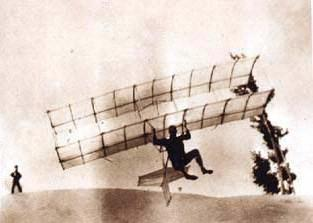

In [101]:
display(IImage(filename=f'{images_dir}/3100.jpg'))

In [77]:
# create_zip_file(images_dir)

In [102]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [103]:
print(device)

cuda


In [104]:
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_feature_extractor", model_type="base", is_eval=True, device=device)

In [105]:
images = images_df.img_id.to_list()
docs = images_df.captions.to_list()

In [106]:
print(len(images))
print(len(docs))

4692
4692


In [81]:
embeddings = []
for i in tqdm(range(len(images))):
    raw_image = vis_processors["eval"](Image.open(images[i]).convert("RGB")).unsqueeze(0).to(device)
    text_input = txt_processors["eval"](docs[i])
    sample = {'image': raw_image, 
              'text_input': [text_input]}
    
    features_image = model.extract_features(sample, mode="image")
#     features_text = model.extract_features(sample, mode="text")
#     features_multimodal = model.extract_features(sample)
    img_emb = features_image.image_embeds[:,0,:].cpu().numpy()
#     img_emb = features_multimodal.multimodal_embeds[:,0,:].cpu().numpy()
    embeddings.extend(img_emb.tolist())


embeddings = np.array(embeddings)

100%|██████████| 4154/4154 [04:56<00:00, 14.01it/s]


In [107]:
embeddings = []
for i in tqdm(range(len(images))):
    raw_image = vis_processors["eval"](Image.open(images[i]).convert("RGB")).unsqueeze(0).to(device)
    text_input = txt_processors["eval"](docs[i])
    sample = {'image': raw_image, 
              'text_input': [text_input]}
    

    features_multimodal = model.extract_features(sample)
    img_emb = features_multimodal.multimodal_embeds[:,0,:].cpu().numpy()
    embeddings.extend(img_emb.tolist())


embeddings = np.array(embeddings)

100%|██████████| 4692/4692 [05:07<00:00, 15.25it/s]


In [108]:
len(docs)

4692

In [109]:
all_data = []
for idx in cluster_data:
    all_data.extend(cluster_data[idx]['data'])
len(all_data)

315819

In [110]:
vocabulary = CountVectorizer().fit(all_data).vocabulary_
pattern = re.compile(r"^[a-zA-Z0-9]+$")
kw_1 = [word for word in list(vocabulary.keys()) if pattern.match(word)]
len(kw_1)

264300

In [97]:
# vocabulary = CountVectorizer().fit(cluster_data[0]['data']).vocabulary_
# len(vocabulary)

51974

In [ ]:
# vocabulary

In [116]:
# kw_model = KeyBERT()
# keywords = kw_model.extract_keywords(cluster_data[0]['data'])

In [117]:
# vocabulary_1 = [k[0] for keyword in keywords for k in keyword]
# vocabulary_1 = list(set(vocabulary_1))

In [229]:
# lem_keys = []
# for el in vocabulary_1:
#     w = lemmatizer.lemmatize(el, get_wordnet_pos(el))
#     lem_keys.append(w)
# lem_keys = list(set(lem_keys))

In [230]:
# sim_keys = []
# for el in lem_keys:
#     sim_keys.append(get_sim(el, 'pedestrian'))

In [ ]:
# df_k = pd.DataFrame({'words':lem_keys, 'score':sim_keys})
# df_k = df_k.sort_values(by=['score'], ascending=False)
# df_k

In [111]:

vectorizer_model = CountVectorizer(stop_words="english", vocabulary=kw_1, ngram_range=(1, 3))

representation_model = MaximalMarginalRelevance(diversity=0.5)


In [ ]:
# topic_model_img = BERTopic(vectorizer_model=vectorizer_model,
#                            representation_model=representation_model)
# topics_img, probs_img = topic_model_img.fit_transform(docs, embeddings)
# images_df["topic"] = topics_img

In [112]:

topic_model_img = BERTopic(vectorizer_model=vectorizer_model, language='multilingual',
                           representation_model=representation_model, calculate_probabilities=True)
topics_img, probs_img = topic_model_img.fit_transform(docs, embeddings)
images_df["topic"] = topics_img

/home/xtest/miniconda3/envs/lavis/lib/python3.8/site-packages/bertopic/vectorizers/_ctfidf.py:69: RuntimeWarning: divide by zero encountered in divide
  idf = np.log((avg_nr_samples / df)+1)


In [113]:
images_df

,captions,img_id,img_url,topic
0,MQ8 Fire Scout English 050627N0295M256 St Inig...,/home/xtest/projects/av_all/images/0.jpg,https://aise.blob.core.windows.net/aise1/0.jpg,-1
1,A simulation screenshot of a bumblebeesized MA...,/home/xtest/projects/av_all/images/1.jpg,https://aise.blob.core.windows.net/aise1/1.jpg,-1
2,English Photo by Ron Frazier and Joseph Norto...,/home/xtest/projects/av_all/images/2.jpg,https://aise.blob.core.windows.net/aise1/2.jpg,-1
3,Description Teledyne Ryan Firebee UAV target ...,/home/xtest/projects/av_all/images/3.jpg,https://aise.blob.core.windows.net/aise1/3.jpg,-1
4,Micro Air Vehicle with attached surveillance c...,/home/xtest/projects/av_all/images/4.jpg,https://aise.blob.core.windows.net/aise1/4.jpg,0
...,...,...,...,...
4687,Soldiers of the brigade inspect a downed UAV E...,/home/xtest/projects/av_all/images/4687.jpg,https://aise.blob.core.windows.net/aise1/4687.jpg,-1
4688,Observer flying badge English Obs wing,/home/xtest/projects/av_all/images/4688.jpg,https://aise.blob.core.windows.net/aise1/4688.jpg,11
4689,DABYD the aircraft involved in the hijacking o...,/home/xtest/projects/av_all/images/4689.jpg,https://aise.blob.core.windows.net/aise1/4689.jpg,70
4690,F6 cockpit XS922 Lightning F6 RAF cockpit section,/home/xtest/projects/av_all/images/4690.jpg,https://aise.blob.core.windows.net/aise1/4690.jpg,-1


In [114]:
info_df = topic_model_img.get_topic_info()
info_df

,Topic,Count,Name
0,-1,1788,-1_aircraft_english_airlines_airport
1,0,207,0_refueling_stratotanker_air_tactical
2,1,103,1_wreckage_crash_site_flight
3,2,101,2_douglas_airways_airport_1971
4,3,89,3_afb_sabre_lockheed_squadron
...,...,...,...
82,81,10,81_townsend_scott_acorns_cwa
83,82,10,82_drawing_albatros_pencil_bays
84,83,10,83_lined_417_tunisia_spitfire
85,84,10,84_rafale_dassault_aok_spacejet


In [115]:
document_info = topic_model_img.get_document_info(docs)

In [116]:
document_info

,Document,Topic,Name,Top_n_words,Probability,Representative_document
0,MQ8 Fire Scout English 050627N0295M256 St Inig...,-1,-1_aircraft_english_airlines_airport,aircraft - english - airlines - airport - air ...,0.313361,False
1,A simulation screenshot of a bumblebeesized MA...,-1,-1_aircraft_english_airlines_airport,aircraft - english - airlines - airport - air ...,0.886881,False
2,English Photo by Ron Frazier and Joseph Norto...,-1,-1_aircraft_english_airlines_airport,aircraft - english - airlines - airport - air ...,0.764324,False
3,Description Teledyne Ryan Firebee UAV target ...,-1,-1_aircraft_english_airlines_airport,aircraft - english - airlines - airport - air ...,0.802466,False
4,Micro Air Vehicle with attached surveillance c...,0,0_refueling_stratotanker_air_tactical,refueling - stratotanker - air - tactical - st...,0.269022,False
...,...,...,...,...,...,...
4687,Soldiers of the brigade inspect a downed UAV E...,-1,-1_aircraft_english_airlines_airport,aircraft - english - airlines - airport - air ...,0.742376,False
4688,Observer flying badge English Obs wing,11,11_emblem_insignia_badge_wings,emblem - insignia - badge - wings - army - avi...,0.284693,False
4689,DABYD the aircraft involved in the hijacking o...,70,70_airtransit_alsace_corvette_tenneco,airtransit - alsace - corvette - tenneco - aer...,1.000000,False
4690,F6 cockpit XS922 Lightning F6 RAF cockpit section,-1,-1_aircraft_english_airlines_airport,aircraft - english - airlines - airport - air ...,0.241818,False


In [117]:
# save images_df to csv
images_df.to_csv(f'images_df_av.csv', index=False)


In [118]:
# topic_model_img save model
topic_model_img.save("data/models/images_model_av")

In [119]:
# save document_info to csv
document_info.to_csv(f'document_info_av.csv', index=False)

In [ ]:
# empty_dimensionality_model = BaseDimensionalityReduction()
# clf = LogisticRegression()
# ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)


In [134]:


# topic_model_txt = BERTopic(vectorizer_model=vectorizer_model, language='multilingual',
#                            representation_model=representation_model, 
#                            umap_model=empty_dimensionality_model,
#                            hdbscan_model=clf, ctfidf_model=ctfidf_model)
# topics_txt, probs_txt = topic_model_txt.fit_transform(cluster_data[0]['data'], y=np.array(cluster_data[0]['target']))


/home/xtest/miniconda3/envs/lavis/lib/python3.8/site-packages/bertopic/vectorizers/_ctfidf.py:69: RuntimeWarning: divide by zero encountered in divide
  idf = np.log((avg_nr_samples / df)+1)


In [138]:
# sim_matrix = cosine_similarity(topic_model_img.c_tf_idf_, topic_model_txt.c_tf_idf_)

In [139]:
# mappings = []
# for topic_a in set(topics_txt):
#     if topic_a != -1:
#         topic_b = np.argmax(sim_matrix[topic_a + 1]) - 1
#         similarity = np.max(sim_matrix[topic_a + 1])
        
#         if similarity > 0:
#             mappings.append((topic_a, topic_b, similarity))

In [ ]:
# mappings

In [ ]:
# topic_model_txt_1 = BERTopic(vectorizer_model=vectorizer_model, language='multilingual',
#                            representation_model=representation_model, 
#                            umap_model=empty_dimensionality_model,
#                            hdbscan_model=clf, ctfidf_model=ctfidf_model)
# topics_txt_1, probs_txt_1 = topic_model_txt_1.fit_transform(cluster_data[1]['data'], y=np.array(cluster_data[1]['target']))


In [143]:
# sim_matrix = cosine_similarity(topic_model_img.c_tf_idf_, topic_model_txt_1.c_tf_idf_)

In [144]:
# mappings = []
# for topic_a in set(topics_txt_1):
#     if topic_a != -1:
#         topic_b = np.argmax(sim_matrix[topic_a + 1]) - 1
#         similarity = np.max(sim_matrix[topic_a + 1])
        
#         if similarity > 0:
#             mappings.append((topic_a, topic_b, similarity))

In [ ]:
# topic_model_txt_1.get_topics()

In [ ]:
# topic_model_txt.get_topic(mappings[0][0]), topic_model_img.get_topic(mappings[0][1])


## Comaprisation

In [120]:
def stem_words(word_list):
    # Stem words in each sublist
    stemmed_word_list = []

    lem_words = []
    for el in word_list:
        w = lemmatizer.lemmatize(el, get_wordnet_pos(el))
        lem_words.append(w)
    stemmed_word_list = list(set(lem_words))

    return stemmed_word_list


In [121]:
sentence_model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Compute the embedding of the word "pedestrian"
pedestrian_embedding = sentence_model.encode("pedestrian", convert_to_tensor=True).to('cuda')


In [122]:
# Function to order words based on similarity to "pedestrian"
def order_words_by_similarity(sublist):
    # Compute embeddings for each word in the sublist
    word_embeddings = sentence_model.encode(sublist, convert_to_tensor=True).to('cuda')
    
    # Calculate cosine similarity between each word embedding and the pedestrian embedding
    similarities = util.pytorch_cos_sim(word_embeddings, pedestrian_embedding).cpu().numpy()
    
    # Sort words based on similarity
    ordered_words = [word for _, word in sorted(zip(similarities, sublist), reverse=True)]
    
    return ordered_words

In [126]:
empty_dimensionality_model = BaseDimensionalityReduction()
clf = LogisticRegression()
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3))
representation_model = MaximalMarginalRelevance(diversity=0.5)

In [127]:
def get_supervised_mappings():
    models_dic = dict()
    mappings_dict = dict()
    for cid in tqdm(range(num_clusters)):
        models_dic[cid] = dict()
        c_path = f"data/models/av/supervised_{cid}"

        
        
        # topic_model_txt = BERTopic(vectorizer_model=vectorizer_model, language='multilingual',
        #                            representation_model=representation_model, 
        #                            umap_model=empty_dimensionality_model,
        #                             hdbscan_model=clf, ctfidf_model=ctfidf_model)
        # topics_txt, probs_txt = topic_model_txt.fit_transform(cluster_data[cid]['data'], 
        #                                             y=np.array(cluster_data[cid]['target']))

        # topic_model_txt.save(c_path)


        topic_model_txt = BERTopic.load(f"{c_path}")
        
        
        xxx = topic_model_txt.get_topics()

        previous_words = []

        all_words_list = []

        for i, el in enumerate(xxx):
            
            # print(f'{i}: {xxx[el]}')
            # get first element of each tuple in list
            new_words_list = []
            words_list = stem_words([e[0] for e in xxx[el]])
            if all(item == '' for item in words_list):
                continue
            words_list = order_words_by_similarity(words_list)
            for el in words_list:
                if el not in previous_words:
                    new_words_list.append(el)
                    previous_words.append(el)
                if len(new_words_list) == 5:
                    break
            
            if new_words_list:
                all_words_list.append(new_words_list)
                
                models_dic[cid][i] = dict()
                models_dic[cid][i]['words'] = new_words_list
                models_dic[cid][i]['id'] = i

                test_embeddings = []
                text_input = txt_processors["eval"](f"{' '.join(new_words_list)}")
                features_text = model.extract_features({'image': "", 
                        'text_input': [text_input]}, mode="text")
                txt_emb= features_text.text_embeds[:,0,:].cpu().numpy()
                test_embeddings.extend(txt_emb.tolist())
                test_embeddings = np.array(test_embeddings)
                
                s_score = util.cos_sim(test_embeddings, embeddings)
                s_score = s_score.detach().cpu().numpy()
                s_score = np.array(s_score[0])
                s_score = np.array(s_score)
                
                # num of top similar images
                sim_num = 100
                idx = np.argpartition(s_score, -sim_num)[-sim_num:]
                idx = idx[np.argsort(s_score[idx])]
                idx = idx[::-1]
                similarity_score = list(s_score[idx])
                img_ids = list(idx)
                models_dic[cid][i]['similarity_score'] = [float(x) for x in similarity_score]
                models_dic[cid][i]['img_ids'] = [int(x) for x in img_ids]


        # break
    # # for el in all_words_list:
    # #     print(el)
    # print(previous_words)
    return models_dic
        


In [128]:
model_dict = get_supervised_mappings()
# print dictionary json like


  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [28:26<00:00, 56.88s/it]


In [129]:
print(json.dumps(model_dict, indent=4))

{
    "0": {
        "0": {
            "words": [
                "angle",
                "orthogonal",
                "coordinate",
                "tetrahedron",
                "angular"
            ],
            "id": 0,
            "similarity_score": [
                0.4308793755795094,
                0.4118587242255989,
                0.38182085032175567,
                0.36870709620432485,
                0.3644850454116509,
                0.3543268641380886,
                0.3481087107766866,
                0.3473804863880019,
                0.3446067392808763,
                0.34406558737847426,
                0.3427665037363634,
                0.3426023483743064,
                0.34228980323613833,
                0.3397563254074235,
                0.33665476634748936,
                0.33635527384592484,
                0.3357798071329795,
                0.33518412002502085,
                0.33419990272499434,
                0.3332290394925973,
         

In [130]:
def get_lemmas(g_words):
    lem_words_test = []
    for el in g_words:
        w = lemmatizer.lemmatize(el, get_wordnet_pos(el))
        lem_words_test.append(w)
    lem_words_test = list(set(lem_words_test))
    return lem_words_test

In [131]:
def get_representative_words(words, num_clusters=2):    
    pedestrian_words = ['street', 'commuter', 'crosswalk', 'pedestrian', 'passenger', 'walk', 'traffic', 'sidewalk', 'cyclist', 'stroll', 'person', 'roadway']

    # Encode the words using SentenceTransformer
    smodel = SentenceTransformer('all-MiniLM-L6-v2')
    words = [word for word in words if not any(char.isdigit() for char in word) and len(word) >= 2]
    if len(words) < num_clusters:
        return words
    
    word_embeddings = smodel.encode(words)


    cluster_model = AgglomerativeClustering(n_clusters=num_clusters)
    cluster_labels = cluster_model.fit_predict(word_embeddings)

    # Find the most similar word in each cluster to the pedestrian_words
    pedestrian_embeddings = smodel.encode(pedestrian_words)
    selected_words = []
    for i in range(num_clusters):
        cluster_words = np.array(words)[cluster_labels == i]
        cluster_embeddings = word_embeddings[cluster_labels == i]
        similarities = cosine_similarity(cluster_embeddings, pedestrian_embeddings)
        best_word_idx = np.argmax(similarities.sum(axis=1))
        selected_word = cluster_words[best_word_idx]
        selected_words.append(selected_word)

    # Print the selected words
    return selected_words

In [132]:
def get_id_for_child(idx, col):
    s = 30
    for idxx in range(idx):
        s += len(model_dict[idxx])
    return s + col

In [141]:
flare_dict = dict()
flare_dict['name'] = 'Aircraft'
flare_dict['children'] = []

In [142]:
for key1, inner_dict1 in model_dict.items():
    print(f"Key1: {key1}")
    
    c_terms = get_lemmas(list(set(list(dict_of_idx[key1].values()))))
    centroid_2 = get_representative_words(c_terms, num_clusters=2)
    centroid_3 = get_representative_words(c_terms, num_clusters=3)
    print(centroid_2)
    merged = centroid_2.copy()
    for elem in centroid_3 + c_terms:
        if elem not in merged:
            merged.append(elem)
    childs = {'id': key1, 'cid': key1, 'name': idx, 'children': [], 
              'labels': merged}
    
    for key2, inner_dict2 in inner_dict1.items():
        print(f"  Key2: {key2}")
        child_id  = get_id_for_child(key1, key2)
        
        print(f"  child_id: {child_id}")
        childs['children'].append({'id': child_id, 'cid': key1, 
                                   'name': child_id, 
                                   'labels': inner_dict2["words"], 
                                   'txt_tid': int(inner_dict2["id"]), 
                                   'img_tid': 0,
                                   'similarfity': 0,
                                   'img_ids': inner_dict2["img_ids"],
                                   'similarity_score': inner_dict2["similarity_score"]})
    flare_dict['children'].append(childs)

Key1: 0
['direction', 'outwing']
  Key2: 0
  child_id: 30
  Key2: 1
  child_id: 31
  Key2: 2
  child_id: 32
  Key2: 3
  child_id: 33
  Key2: 4
  child_id: 34
  Key2: 5
  child_id: 35
  Key2: 6
  child_id: 36
  Key2: 7
  child_id: 37
  Key2: 8
  child_id: 38
  Key2: 9
  child_id: 39
  Key2: 10
  child_id: 40
  Key2: 11
  child_id: 41
  Key2: 12
  child_id: 42
  Key2: 13
  child_id: 43
  Key2: 14
  child_id: 44
  Key2: 15
  child_id: 45
  Key2: 16
  child_id: 46
  Key2: 17
  child_id: 47
  Key2: 18
  child_id: 48
  Key2: 19
  child_id: 49
  Key2: 20
  child_id: 50
  Key2: 21
  child_id: 51
  Key2: 22
  child_id: 52
  Key2: 23
  child_id: 53
  Key2: 24
  child_id: 54
  Key2: 25
  child_id: 55
  Key2: 26
  child_id: 56
Key1: 1
['location', 'lincoln']
  Key2: 0
  child_id: 57
  Key2: 1
  child_id: 58
  Key2: 2
  child_id: 59
  Key2: 3
  child_id: 60
  Key2: 4
  child_id: 61
  Key2: 5
  child_id: 62
  Key2: 6
  child_id: 63
  Key2: 7
  child_id: 64
  Key2: 8
  child_id: 65
  Key2: 9
  child_

In [143]:
flare_dict

{'name': 'Aircraft',
 'children': [{'id': 0,
   'cid': 0,
   'name': 29,
   'children': [{'id': 30,
     'cid': 0,
     'name': 30,
     'labels': ['angle', 'orthogonal', 'coordinate', 'tetrahedron', 'angular'],
     'txt_tid': 0,
     'img_tid': 0,
     'similarfity': 0,
     'img_ids': [2051,
      1466,
      380,
      1965,
      4383,
      275,
      105,
      4342,
      2934,
      455,
      52,
      1333,
      565,
      550,
      1267,
      106,
      284,
      4588,
      686,
      222,
      2135,
      3824,
      2955,
      626,
      1441,
      4127,
      4466,
      4320,
      1968,
      3973,
      228,
      3007,
      3465,
      349,
      3335,
      3886,
      4490,
      109,
      4479,
      1880,
      2113,
      487,
      3800,
      2786,
      593,
      4577,
      4468,
      1355,
      3768,
      4500,
      3502,
      93,
      22,
      3452,
      1866,
      484,
      1902,
      3562,
      4052,
      2026,
      4649,
      3

In [144]:
json_object = json.dumps(flare_dict, indent=4)
with open("flare_example_av.json", "w") as outfile:
    outfile.write(json_object)

In [ ]:
for key1, inner_dict1 in model_dict.items():
    print(f"Key1: {key1}")

    list_of_words = []
    
    c_terms = get_lemmas(list(set(list(dict_of_idx[key1].values()))))
    centroid_2 = get_representative_words(c_terms, num_clusters=2)
    centroid_3 = get_representative_words(c_terms, num_clusters=3)
    # print(centroid_2)
    merged = centroid_2.copy()
    for elem in centroid_3 + c_terms:
        if elem not in merged:
            merged.append(elem)
    
    childs = {'id': key1, 'cid': key1, 'name': idx, 'children': [], 
              'labels': merged}

    for key2, inner_dict2 in inner_dict1.items():
        # print(f"  Key2: {key2}")
        list_of_words.extend(inner_dict2['words'])
        child_id  = get_id_for_child(key1, key2)
        
        # print(f"  child_id: {child_id}")
        childs['children'].append({'id': child_id, 'cid': key1, 
                                   'name': child_id, 
                                   'labels': inner_dict2["words"], 
                                   'txt_tid': int(inner_dict2["id"]), 
                                   'img_tid': 0,
                                   'similarfity': 0,
                                   'img_ids': inner_dict2["img_ids"],
                                   'similarity_score': inner_dict2["similarity_score"]})
    
    list_of_words = list(set(list_of_words))
    # find diff between merged and list_of_words
    diff = [x for x in merged if x not in list_of_words]
    # find common between merged and list_of_words
    common = [x for x in merged if x in list_of_words]

    
    if len(common) >= 6:
        # remove pedestrian if exist in common
        if 'pedestrian' in common:
            common.remove('pedestrian')
        representative_words = order_words_by_similarity(common)[:5]
        
    elif common and len(common) < 5:
        list_of_words = order_words_by_similarity(list_of_words)
        # find diff between list_of_words and common
        diff_common = [x for x in list_of_words if x not in common]
        
        if 'pedestrian' in common:
            common.remove('pedestrian')
        if 'pedestrian' in diff_common:
            diff_common.remove('pedestrian')

        representative_words = common + diff_common[:5-len(common)]

    else:
        representative_words = order_words_by_similarity(list_of_words)
        if 'pedestrian' in representative_words:
            representative_words.remove('pedestrian')
        representative_words = representative_words[:5]

    
    childs['labels'] = representative_words
    print(f"  representative_words: {representative_words}")


    
    flare_dict['children'].append(childs)

In [201]:
for idx in dict_of_idx:
    c_terms = get_lemmas(list(set(list(dict_of_idx[idx].values()))))
    centroid_2 = get_representative_words(c_terms, num_clusters=2)
    centroid_3 = get_representative_words(c_terms, num_clusters=3)
    print(centroid_2)
    merged = centroid_2.copy()
    for elem in centroid_3 + c_terms:
        if elem not in merged:
            merged.append(elem)
    childs = {'id': idx, 'cid': idx, 'name': idx, 'children': [], 
              'labels': merged}
    print(idx)

    for i, el in enumerate(mappings_dict[idx]):
        child_terms = get_lemmas([t[0] for t in el['text_topic']])
        centroid_2 = get_representative_words(child_terms, num_clusters=2)
        centroid_3 = get_representative_words(child_terms, num_clusters=3)
        merged_1 = centroid_2.copy()
        for elem in centroid_3 + child_terms:
            if elem not in merged_1:
                merged_1.append(elem)
        childs['children'].append({'id': get_id_for_child(idx, i), 'cid': idx, 
                                   'name': get_id_for_child(idx, i), 
                                   'labels': merged_1, 
                                   'txt_tid': int(el['text_topic_id']), 
                                   'img_tid': int(el['img_topic_id']),
                                   'similarity': round(el['similarity'],3)})
   
    flare_dict['children'].append(childs)

['path', 'accessible']
0
Key1: 0
Key1: 1
Key1: 2
Key1: 3
Key1: 4
Key1: 5
Key1: 6
Key1: 7
Key1: 8
Key1: 9
Key1: 10
Key1: 11
Key1: 12
Key1: 13
Key1: 14
Key1: 15
Key1: 16
Key1: 17
Key1: 18
Key1: 19
Key1: 20
Key1: 21
Key1: 22
Key1: 23
Key1: 24
Key1: 25
Key1: 26
Key1: 27
Key1: 28
Key1: 29


In [103]:
def get_supervised_mappings():
    models_dic = dict()
    mappings_dict = dict()
    for cid in tqdm(range(num_clusters)):
#         print(cid)

        
        topic_model_txt = BERTopic(vectorizer_model=vectorizer_model, language='multilingual',
                                   representation_model=representation_model, 
                                   umap_model=empty_dimensionality_model,
                                    hdbscan_model=clf, ctfidf_model=ctfidf_model)
        topics_txt, probs_txt = topic_model_txt.fit_transform(cluster_data[cid]['data'], 
                                                    y=np.array(cluster_data[cid]['target']))
        
        if len(set(topics_txt)) > len(set(topics_img)):
            topic_model_txt = BERTopic(vectorizer_model=vectorizer_model, language='multilingual',
                                   representation_model=representation_model, 
                                   umap_model=empty_dimensionality_model,
                                    hdbscan_model=clf, ctfidf_model=ctfidf_model, 
                                       nr_topics=len(set(topics_img))-2)
            topics_txt, probs_txt = topic_model_txt.fit_transform(cluster_data[cid]['data'], 
                                                        y=np.array(cluster_data[cid]['target']))

        sim_matrix = cosine_similarity(topic_model_img.c_tf_idf_, topic_model_txt.c_tf_idf_)
        
        mappings_dict[cid] = []
#         mappings = []
        for topic_a in set(topics_txt):
            if topic_a != -1:
                topic_b = np.argmax(sim_matrix[topic_a + 1]) - 1
                similarity = np.max(sim_matrix[topic_a + 1])

#                 mappings.append((topic_a, topic_b, similarity))
                mappings_dict[cid].append({'text_topic_id': topic_a, 'img_topic_id': topic_b, 
                                           'similarity': similarity, 
                                          'text_topic': topic_model_txt.get_topic(topic_a)})

        
        models_dic[cid] = f"data/models/supervised_{cid}"
        topic_model_txt.save(models_dic[cid])
#         break
        
    
    return mappings_dict, models_dic

In [104]:
mappings_dict, models_dic = get_supervised_mappings()

  0%|          | 0/30 [00:00<?, ?it/s]

/home/xtest/miniconda3/envs/lavis/lib/python3.8/site-packages/bertopic/vectorizers/_ctfidf.py:69: RuntimeWarning: divide by zero encountered in divide
  idf = np.log((avg_nr_samples / df)+1)
  3%|▎         | 1/30 [00:29<14:22, 29.73s/it]/home/xtest/miniconda3/envs/lavis/lib/python3.8/site-packages/bertopic/vectorizers/_ctfidf.py:69: RuntimeWarning: divide by zero encountered in divide
  idf = np.log((avg_nr_samples / df)+1)
  7%|▋         | 2/30 [01:08<16:21, 35.05s/it]/home/xtest/miniconda3/envs/lavis/lib/python3.8/site-packages/bertopic/vectorizers/_ctfidf.py:69: RuntimeWarning: divide by zero encountered in divide
  idf = np.log((avg_nr_samples / df)+1)
 10%|█         | 3/30 [01:52<17:33, 39.02s/it]/home/xtest/miniconda3/envs/lavis/lib/python3.8/site-packages/bertopic/vectorizers/_ctfidf.py:69: RuntimeWarning: divide by zero encountered in divide
  idf = np.log((avg_nr_samples / df)+1)
 13%|█▎        | 4/30 [02:37<17:53, 41.29s/it]/home/xtest/miniconda3/envs/lavis/lib/python3.8/site

In [ ]:
mappings_dict

In [100]:
for cid in mappings_dict:
    for el in mappings_dict[cid]:
        print(el)
        break
    break

{'text_topic_id': 0, 'img_topic_id': 1, 'similarity': 0.27751764935637213, 'text_topic': [('february', 0.29061244760091426), ('comments', 0.27961531458259303), ('page', 0.2750374129461973), ('july', 0.2590983228809672), ('articles', 0.2553523344433994), ('don', 0.2551164852685727), ('good', 0.25008775549316276), ('2011', 0.2426398833901936), ('21', 0.24025948169498967), ('support', 0.23665695330428557)]}


In [101]:
mappings_dict[0][0]['text_topic']

[('february', 0.29061244760091426),
 ('comments', 0.27961531458259303),
 ('page', 0.2750374129461973),
 ('july', 0.2590983228809672),
 ('articles', 0.2553523344433994),
 ('don', 0.2551164852685727),
 ('good', 0.25008775549316276),
 ('2011', 0.2426398833901936),
 ('21', 0.24025948169498967),
 ('support', 0.23665695330428557)]

In [102]:
[t[0] for t in mappings_dict[0][0]['text_topic']]

['february',
 'comments',
 'page',
 'july',
 'articles',
 'don',
 'good',
 '2011',
 '21',
 'support']

In [103]:
mappings_dict[0]

[{'text_topic_id': 0,
  'img_topic_id': 1,
  'similarity': 0.27751764935637213,
  'text_topic': [('february', 0.29061244760091426),
   ('comments', 0.27961531458259303),
   ('page', 0.2750374129461973),
   ('july', 0.2590983228809672),
   ('articles', 0.2553523344433994),
   ('don', 0.2551164852685727),
   ('good', 0.25008775549316276),
   ('2011', 0.2426398833901936),
   ('21', 0.24025948169498967),
   ('support', 0.23665695330428557)]},
 {'text_topic_id': 1,
  'img_topic_id': 2,
  'similarity': 0.2093395879608739,
  'text_topic': [('park', 0.3141037481609156),
   ('beach', 0.2307497384751778),
   ('river', 0.22339267018890877),
   ('state', 0.21040100633946637),
   ('largest', 0.2089858717193555),
   ('milwaukee', 0.204672596854139),
   ('berlin', 0.2034880660952236),
   ('population', 0.20304937370880152),
   ('town', 0.20202710054333287),
   ('airport', 0.20108921591730738)]},
 {'text_topic_id': 2,
  'img_topic_id': 0,
  'similarity': 0.21953256554415268,
  'text_topic': [('traffic

In [104]:
mappings_dict[29][0]['text_topic']

[('station', 0.283348096737436),
 ('berlin', 0.23064783807422806),
 ('airport', 0.20418125828326303),
 ('japan', 0.20251563141190013),
 ('singapore', 0.1994558564583839),
 ('sign', 0.19261568115840566),
 ('r6', 0.17706751039615853),
 ('trains', 0.17632495475075863),
 ('buses', 0.17028910564547778),
 ('parking', 0.1699803587818621)]

## Flare data

In [120]:
from scipy.spatial.distance import cosine


In [139]:
def get_lemmas(g_words):
    lem_words_test = []
    for el in g_words:
        w = lemmatizer.lemmatize(el, get_wordnet_pos(el))
        lem_words_test.append(w)
    lem_words_test = list(set(lem_words_test))
    return lem_words_test

In [197]:
def get_representative_words(words, num_clusters=2):    
    pedestrian_words = ['street', 'commuter', 'crosswalk', 'pedestrian', 'passenger', 'walk', 'traffic', 'sidewalk', 'cyclist', 'stroll', 'person', 'roadway']

    # Encode the words using SentenceTransformer
    smodel = SentenceTransformer('all-MiniLM-L6-v2')
    words = [word for word in words if not any(char.isdigit() for char in word) and len(word) >= 2]
    if len(words) < num_clusters:
        return words
    
    word_embeddings = smodel.encode(words)


    cluster_model = AgglomerativeClustering(n_clusters=num_clusters)
    cluster_labels = cluster_model.fit_predict(word_embeddings)

    # Find the most similar word in each cluster to the pedestrian_words
    pedestrian_embeddings = smodel.encode(pedestrian_words)
    selected_words = []
    for i in range(num_clusters):
        cluster_words = np.array(words)[cluster_labels == i]
        cluster_embeddings = word_embeddings[cluster_labels == i]
        similarities = cosine_similarity(cluster_embeddings, pedestrian_embeddings)
        best_word_idx = np.argmax(similarities.sum(axis=1))
        selected_word = cluster_words[best_word_idx]
        selected_words.append(selected_word)

    # Print the selected words
    return selected_words

In [140]:
def get_centroid_similarity(lem_words_test, num_clusters=2):
    # Define the SentenceTransformer model
    model_test = SentenceTransformer('all-MiniLM-L6-v2')

    # Encode the terms using the SentenceTransformer model
    term_embeddings = model_test.encode(lem_words_test)

    
    # Perform k-means clustering on the term embeddings
    kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(term_embeddings)

    # Get the centroids of the clusters
    centroids = kmeans.cluster_centers_

    # Calculate the pairwise cosine similarities between the centroids
    similarities = [[1 - cosine(centroids[i], centroids[j]) for j in range(num_clusters)] for i in range(num_clusters)]

    # Select the words with the lowest similarity to each other
    selected_words = []
    for i in range(num_clusters):
        min_similarity = 1
        min_index = -1
        for j in range(len(lem_words_test)):
            if kmeans.labels_[j] == i:
                similarity = min([similarities[i][k] for k in range(num_clusters) if k != i])
                if similarity < min_similarity:
                    min_similarity = similarity
                    min_index = j
        selected_words.append(lem_words_test[min_index])

    # Print the selected words
    return list(set(selected_words))

In [207]:
c_terms = ['park',
      'large',
      'airport',
      'river',
      'milwaukee',
      'town',
      'state',
      'population',
      'berlin',
      'beach']
centroid_2 = get_representative_words(c_terms, num_clusters=2)
centroid_3 = get_representative_words(c_terms, num_clusters=3)
print(c_terms)

['park', 'large', 'airport', 'river', 'milwaukee', 'town', 'state', 'population', 'berlin', 'beach']


In [208]:
centroid_2

['park', 'large']

In [209]:
centroid_3

['park', 'large', 'airport']

In [202]:
merged = centroid_2.copy()

for elem in centroid_3 + c_terms:
    if elem not in merged:
        merged.append(elem)
merged

['hike',
 'environment',
 'tree',
 'earthbound',
 'tree-lined',
 'boardwalk',
 'yellowline',
 'trail',
 'park',
 'last mile',
 'mountain lion',
 'fence',
 'naturestrip',
 'unbelted',
 'natural environment',
 'swamp rabbit',
 'trek',
 'treelawn',
 'vagrant',
 'pasture',
 'scenic',
 'nature',
 'mile',
 'fire hydrant',
 'sage',
 'retaining wall',
 'enjoy nature',
 'shelter',
 'fertile crescent',
 'canoe',
 'landscape',
 'scenicroute',
 'refuge']

In [137]:
def get_id_for_child(idx, col):
    s = 30
    for idxx in range(idx):
        s += len(mappings_dict[idxx])
    return s + col

In [138]:
get_id_for_child(2, 5)

64

In [135]:
len(mappings_dict[0])

6

In [136]:
len(mappings_dict[1])

23

In [203]:
flare_dict = dict()
flare_dict['name'] = 'Pedestrian'
flare_dict['children'] = []

In [204]:
for idx in dict_of_idx:
    c_terms = get_lemmas(list(set(list(dict_of_idx[idx].values()))))
    centroid_2 = get_representative_words(c_terms, num_clusters=2)
    centroid_3 = get_representative_words(c_terms, num_clusters=3)
    merged = centroid_2.copy()
    for elem in centroid_3 + c_terms:
        if elem not in merged:
            merged.append(elem)
    childs = {'id': idx, 'cid': idx, 'name': idx, 'children': [], 
              'labels': merged}
#     print(idx)
    for i, el in enumerate(mappings_dict[idx]):
        child_terms = get_lemmas([t[0] for t in el['text_topic']])
        centroid_2 = get_representative_words(child_terms, num_clusters=2)
        centroid_3 = get_representative_words(child_terms, num_clusters=3)
        merged_1 = centroid_2.copy()
        for elem in centroid_3 + child_terms:
            if elem not in merged_1:
                merged_1.append(elem)
        childs['children'].append({'id': get_id_for_child(idx, i), 'cid': idx, 
                                   'name': get_id_for_child(idx, i), 
                                   'labels': merged_1, 
                                   'txt_tid': int(el['text_topic_id']), 
                                   'img_tid': int(el['img_topic_id']),
                                   'similarity': round(el['similarity'],3)})
   
    flare_dict['children'].append(childs)

In [289]:
# flare_dict = dict()
# flare_dict['name'] = 'Pedestrian'
# flare_dict['children'] = []

In [290]:
# for idx in dict_of_idx:
    
#     childs = {'id': idx, 'cid': idx, 'name': idx, 'children': [], 'labels': list(set(list(dict_of_idx[idx].values())))}
#     for i, el in enumerate(mappings_dict[idx]):
#         if el['similarity'] < 0.26 and el['similarity'] > 0.25:
#             childs['children'].append({'id': get_id_for_child(idx, i), 'cid': idx, 
#                                        'name': get_id_for_child(idx, i), 
#                                        'labels': [t[0] for t in el['text_topic']], 
#                                        'txt_tid': int(el['text_topic_id']), 
#                                        'img_tid': int(el['img_topic_id']),
#                                        'similarity': round(el['similarity'],3)})
   
#     flare_dict['children'].append(childs)

In [206]:
flare_dict

{'name': 'Pedestrian',
 'children': [{'id': 0,
   'cid': 0,
   'name': 0,
   'children': [{'id': 30,
     'cid': 0,
     'name': 30,
     'labels': ['page',
      'february',
      'comment',
      '21',
      'good',
      'article',
      '2011',
      'support',
      'don',
      'july'],
     'txt_tid': 0,
     'img_tid': 1,
     'similarity': 0.278},
    {'id': 31,
     'cid': 0,
     'name': 31,
     'labels': ['park',
      'large',
      'airport',
      'river',
      'milwaukee',
      'town',
      'state',
      'population',
      'berlin',
      'beach'],
     'txt_tid': 1,
     'img_tid': 2,
     'similarity': 0.209},
    {'id': 32,
     'cid': 0,
     'name': 32,
     'labels': ['pedestrian',
      'sign',
      'bridge',
      'traffic',
      'cross',
      'stop',
      'new',
      'speed',
      'light',
      'road'],
     'txt_tid': 2,
     'img_tid': 0,
     'similarity': 0.22},
    {'id': 33,
     'cid': 0,
     'name': 33,
     'labels': ['driver',
      'str

In [210]:
type(flare_dict['children'][0]['children'][0]['img_tid'])

int

In [211]:
json_object = json.dumps(flare_dict, indent=4)

In [212]:
with open("flare_v1.json", "w") as outfile:
    outfile.write(json_object)

In [186]:
img_tps = topic_model_img.get_topics()
img_object = json.dumps(img_tps, indent=4)
with open("images_topics.json", "w") as outfile:
    outfile.write(json_object)

In [155]:
mappings_dict

{0: [{'text_topic_id': 0,
   'img_topic_id': 9,
   'similarity': 0.20772640868706246,
   'text_topic': [('sign', 0.3137055098308422),
    ('left', 0.28554406026120743),
    ('parking', 0.2671667785834917),
    ('limit', 0.2592512906218091),
    ('r6', 0.2572315257502684),
    ('roads', 0.23040105694064653),
    ('airbag', 0.21760456077893964),
    ('yellow', 0.21731316117875513),
    ('rumble', 0.2130168242485401),
    ('roundabout', 0.21130379497218632)]},
  {'text_topic_id': 1,
   'img_topic_id': 2,
   'similarity': 0.19340026381194214,
   'text_topic': [('safety', 0.256133155484336),
    ('speed', 0.2110668112276029),
    ('obesity', 0.20313652079397948),
    ('motorcycle', 0.20041174904762987),
    ('drivers', 0.19660872662642018),
    ('deaths', 0.18843003262573854),
    ('crashes', 0.18612535035859631),
    ('collisions', 0.1851708317124874),
    ('test', 0.18209343365970143),
    ('cause', 0.1762500124586653)]},
  {'text_topic_id': 2,
   'img_topic_id': 2,
   'similarity': 0.218

In [156]:
mappings_org_dic

{0: [(0, 9, 0.20772640868706246),
  (1, 2, 0.19340026381194214),
  (2, 2, 0.21872662776000606),
  (3, 13, 0.2461815256496916),
  (4, 7, 0.16492896545498817),
  (5, 3, 0.19336243189363228),
  (6, 3, 0.1207466100822648),
  (7, 4, 0.12069600690352046),
  (8, 3, 0.21793269869426493),
  (9, 2, 0.1584966075977389),
  (10, 2, 0.13101085095169093),
  (11, -1, 0.2125587608454061),
  (12, 9, 0.1894310867610073),
  (13, 3, 0.1256350084075925),
  (14, 3, 0.046649251111979435),
  (15, 3, 0.1334548900705472),
  (16, 13, 0.152885296616204),
  (17, 2, 0.10873607039233081)]}

In [ ]:
def get_supervised_models():
    models_dic = dict()
    topics_dic = dict()
    for cid in tqdm(range(num_clusters)):
#         print(cid)
        empty_dimensionality_model = BaseDimensionalityReduction()
        clf = LogisticRegression()
        ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
        vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3))
        representation_model = MaximalMarginalRelevance(diversity=0.5)
        
        topic_model = BERTopic(vectorizer_model=vectorizer_model, 
                               representation_model=representation_model, 
                               umap_model=empty_dimensionality_model,
                               hdbscan_model=clf, ctfidf_model=ctfidf_model)
        topics, probs = topic_model.fit_transform(cluster_data[cid]['data'], y=np.array(cluster_data[cid]['target']))
       
        
        models_dic[cid] = f"data/models/supervised_{cid}"
        topics_dic[cid] = topics
        topic_model.save(models_dic[cid])
        
#         break
    
    return models_dic, topics_dic

In [138]:
def get_supervised_topics():
    topics_dic = dict()
    for cid in range(num_clusters):
        print(cid)
        empty_dimensionality_model = BaseDimensionalityReduction()
        clf = LogisticRegression()
        ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
        vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3))
        topic_model = BERTopic(vectorizer_model=vectorizer_model, diversity=0.8, umap_model=empty_dimensionality_model,
        hdbscan_model=clf, ctfidf_model=ctfidf_model)
        topics, probs = topic_model.fit_transform(cluster_data[cid]['data'], y=np.array(cluster_data[cid]['target']))
        
        for label in labels[cid]:
            ped_similar_topics_a, ped_similarity_a = topic_model.find_topics(label + " pedestrian", top_n=10)
            l = []
            for t in ped_similar_topics_a:
                for el in topic_model.get_topic(t):
                    l.append(el[0])
        topics_dic[cid] = list(set(l))
    
    return topics_dic

In [139]:
supervised_topics = get_supervised_topics()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29


In [144]:
labels[0]

['skulk',
 'non',
 'tittup',
 'merit',
 'raik',
 'warning',
 'violation',
 'unpaved',
 'stalker',
 'sage',
 'pawn',
 'hov',
 'warn',
 'shamble',
 'shank nag',
 'waulk',
 'shank mare',
 'ward']

In [140]:
supervised_topics

{0: ['level',
  'johnson',
  'lakeview',
  'tunnel',
  'used',
  'crossing',
  'islands',
  'lafayette',
  'bryant park',
  'alcohol',
  'points',
  'opened',
  'us80',
  'wards',
  'warhol',
  'register historic places',
  'rack',
  'sirens',
  'signals',
  'installed',
  'zone',
  'clarita',
  'asphalt',
  'railway',
  'albany',
  'phoenix',
  'center',
  'north',
  'person',
  'rails',
  'drivers',
  '2007',
  'tokyo',
  'selma',
  'river',
  'public',
  'skunk ape',
  'social credit',
  'toro',
  'speed limits',
  'red light',
  'national',
  'washington heights',
  'merit',
  'joyce',
  'united',
  'broadcast',
  'left',
  'sr',
  'stop',
  'network',
  'speed',
  'boardwalk',
  'london',
  'bayona',
  'barnaby',
  'st',
  'limit',
  'triborough bridge',
  'miles',
  'laws',
  'areas',
  'hospital',
  'lincoln highway',
  'reported',
  'warning',
  'park',
  'road signs',
  'orphanage',
  'traffic',
  'sounds',
  'hov',
  'hexham',
  'thai',
  'tactile',
  'raitt',
  'county',
  '

In [125]:
empty_dimensionality_model = BaseDimensionalityReduction()
clf = LogisticRegression()
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3))

In [126]:
topic_model = BERTopic(vectorizer_model=vectorizer_model, diversity=0.8, umap_model=empty_dimensionality_model,
        hdbscan_model=clf,
        ctfidf_model=ctfidf_model)

In [127]:
topics, probs = topic_model.fit_transform(cluster_data[3]['data'], y=np.array(cluster_data[3]['target']))

In [128]:
topic_model.get_topic_info()

,Topic,Count,Name
0,0,1487,0_talk_march 2019_persistent_vandalism
1,1,1471,1_talk_february 2008_georgia tech_article prom...
2,2,1250,2_buses_use_crossing_seattle
3,3,1152,3_carnival_havana_pierce_used
4,4,1128,4_putin_series_brando_butler
5,5,1101,5_acid_tesla_accused_panhandling
6,6,849,6_article_march 2007_utcreplyreply_promoted
7,7,675,7_swansea_canal_glenrothes_mcnair
8,8,661,8_new_bridges_theater_port authority
9,9,518,9_rights way_footpaths_segway_culdesac


In [134]:
labels[3]

['walkman',
 'walk frame',
 'knucklewalk',
 'intentional walk',
 'baby walker',
 'spacewalk',
 'catwalk',
 'footwalk',
 'walker',
 'by walk',
 'walk around',
 'forwalk',
 'walk through',
 'stroll',
 'walkathon',
 'bushwalk',
 'stop walk',
 'random walk',
 'walk in park',
 'firewalk',
 'walkable',
 'walkabout',
 'whistle walk',
 'walk beat',
 'warwalking',
 'jaywalk',
 'walk',
 'walk cane']

In [136]:
for label in labels[3]:
    ped_similar_topics_a, ped_similarity_a = topic_model.find_topics(label + " pedestrian", top_n=10)
    l = []
    for t in ped_similar_topics_a:
        for el in topic_model.get_topic(t):
            l.append(el[0])
print(set(l))

{'buses', '2016 201729in', 'footpath', 'confessions', 'seattle', 'agents', 'used', 'crossing', 'plate indicating', 'transport hubs', 'ampelmnnchen', 'crowd', 'grid', 'reduce', 'steps', 'mutcd', 'calming', 'arrow', 'semesters', 'red', 'signals', 'green', 'traffic lights', 'safety', 'pedestrian fatalities', 'introduced', 'naparima college', 'venice', 'oneway', 'washington park', 'tractor', 'obesity', 'pedestrians', 'jogger', 'ahead', 'feat', 'buttons', 'river', 'mad hatter', 'pedestrian crossing', 'footpaths', 'stretch', 'chinese', 'flashing', 'pontoon', 'bay run', 'covered states standards', '84', 'headphone', 'situations covered', 'ontario', 'meili', 'decreased 18 semesters', 'speed', 'crashes', '2008', 'viaduct', 'shared', 'car', 'use', 'carfree', 'riverside park', 'aps', 'law', 'traffic', 'alleys', 'gaits', 'high line', 'bicycle', 'tactile', 'reckoning', 'millennium', 'bridge', 'states', 'talk', 'street', 'shibuya', 'design', 'signs', 'bridges', 'form level', 'new', 'tetch', 'marina'

In [129]:
len(cluster_data[11]['data'])

22222

In [111]:
ped_similar_topics_a, ped_similarity_a = topic_model.find_topics("walking", top_n=38)
print(ped_similar_topics_a)

[1, 0, -1, 7, 11, 8, 9, 3, 4, 10, 5, 6, 2]


In [112]:
for t in ped_similar_topics_a:
    l = []
    print(t)
    for el in topic_model.get_topic(t):
        l.append(el[0])
    print(l)
#     print(ped_auto_model_a.get_topic(t))
    print('\n')

1
['displaystyle', 'tends', 'serverside', 'stressors', 'transportation encourages walking', 'general availability public', 'climate change internal', 'environment frequent exercise', 'obesity related medical', 'minutes operation engine']


0
['article', 'used', 'bridge', 'pedestrian', 'comments', '2019', 'public', 'park', 'including', 'south']


-1
['new', 'street', 'talk', 'article', 'used', 'time', 'people', 'construction', 'march', 'including']


7
['ahasuerus', 'eternal', 'writer', 'figure', 'cartaphilus', 'man', 'wandering jew appears', 'short story', 'appeared', 'marko']


11
['city', 'private', 'bahria', 'new', 'amenities', 'largest', 'people', 'communities mexico', 'number gated', 'middle class']


8
['total', 'following', 'following subcategories total', 'reflect recent changes', 'list reflect', 'changes category following', 'recent', 'total list', 'pages', 'switch games']


9
['pierces', 'new hampshire', 'new', 'buchanan', 'compromise', 'southern', 'administration', 'support'

In [105]:
hierarchical_topics = topic_model.hierarchical_topics(cluster_data[3]['data'])


100%|███████████████████████████████████████████████████████████████████████████████████| 26/26 [00:05<00:00,  5.09it/s]


In [107]:
tree = topic_model.get_topic_tree(hierarchical_topics)
print(tree)

.
├─pedestrian fatalities_calming_semesters_speed_carfree
│    ├─■──pedestrian fatalities_calming_carfree_speed_semesters ── Topic: 19
│    └─■──pedestrian fatalities_footpath_transport hubs_infrastructures_feat ── Topic: 25
└─talk_bridge_article_used_park
     ├─talk_new_article_march_used
     │    ├─talk_article_used_road_2019
     │    │    ├─march 2019_article_persistent_vandalism_semiprotection
     │    │    │    ├─■──talk_march 2019_persistent_vandalism_semiprotection ── Topic: 0
     │    │    │    └─■──article_march 2007_utcreplyreply_promoted_think ── Topic: 6
     │    │    └─new_park_used_time_traffic
     │    │         ├─new_street_time_people_article
     │    │         │    ├─new_park_used_article_including
     │    │         │    │    ├─■──song_jew_frontage_said_tomlinson ── Topic: 11
     │    │         │    │    └─new_park_used_article_people
     │    │         │    │         ├─used_article_people_park_years
     │    │         │    │         │    ├─new_baltimore_

## Guided Topic Modeling

In [141]:
def get_guided_topics():
    topics_dic = dict()
    for cid in range(num_clusters):
        print(cid)
        
        cluster_seed = list(set(labels[cid] + ['pedestrian']))
        
        
        vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3))
        topic_model = BERTopic(vectorizer_model=vectorizer_model, diversity=0.8, 
                       seed_topic_list=[cluster_seed], nr_topics='auto')
        
        topics, probs = topic_model.fit_transform(cluster_data[cid]['data'])
        
        for label in labels[cid]:
            ped_similar_topics_a, ped_similarity_a = topic_model.find_topics(label + " pedestrian", top_n=10)
            l = []
            for t in ped_similar_topics_a:
                for el in topic_model.get_topic(t):
                    l.append(el[0])
        topics_dic[cid] = list(set(l))
    return topics_dic

In [142]:
guided_topics = get_guided_topics()

0
1
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: 

In [145]:
labels[1]

['crowd',
 'scale',
 'power',
 'natural environment',
 'support',
 'creation',
 'control',
 'deambulatory',
 'speed',
 'density',
 'effect',
 'air',
 'study',
 'emphasis',
 'activity',
 'relation',
 'signal',
 'fashion',
 'energy',
 'design',
 'force',
 'building',
 'factor',
 'uninteresting',
 'system',
 'obesity',
 'pointduty',
 'stream',
 'unmotorized',
 'oncoming',
 'pattern',
 'environment',
 'naturestrip',
 'duty',
 'reduction',
 'behavior',
 'construction',
 'purpose',
 'geometrid',
 'circulation',
 'statue',
 'olympic games',
 'sight',
 'survey',
 'analysis',
 'task',
 'take photo',
 'enjoy nature',
 'busy',
 'view',
 'elevate',
 'style',
 'dress',
 'skill',
 'property',
 'at-grade',
 'line',
 'shopping',
 'cycle',
 'arterial',
 'base on ball',
 'variety',
 'guide',
 'recreational',
 'attention',
 'nature',
 'wind',
 'development',
 'type',
 'form']

In [143]:
guided_topics

{0: ['occupants',
  'astronaut',
  'used',
  'bump',
  'narrows sidesroad narrows',
  'rutherglen',
  'lane vehicles carrying',
  'cross',
  'wearing',
  'deflect',
  'harper',
  'fatality',
  'tim',
  'directional',
  'seat belt legislation',
  'payette',
  'median',
  'heavy vehicles exceeding',
  'concrete barrier',
  'tactile paving',
  'mandatory',
  'children',
  'lanes',
  'cambuslang',
  'farmeloan',
  'roadside',
  'straight',
  'pedestrian',
  'used traffic bottleneck',
  'constituency',
  'road dangerous',
  'vehicles',
  'ahead',
  'built',
  'cycling talk',
  'tenements',
  'edge',
  'blocks installed',
  'buttons',
  'timer',
  'cyclists',
  'graph',
  'exceeding 3500',
  'indicating actual',
  'national',
  'hill',
  'helmet law',
  'left',
  'oneway traffic pointing',
  'australia',
  'towns',
  'change road direction',
  'course priority road',
  'bhrf',
  'limit',
  'uneven',
  'use',
  'dalmarnock',
  'pedestrian signals',
  'march 2013',
  'indicating distance',
  '

In [146]:
augmented_topics = dict()
for el in supervised_topics:
    topics = list(set(supervised_topics[el] + guided_topics[el]))
    lem_words = []
    for ew in topics:
        w = lemmatizer.lemmatize(ew, get_wordnet_pos(ew))
        lem_words.append(w)
    augmented_topics[el] = lem_words

In [147]:
augmented_topics

{0: ['occupant',
  'astronaut',
  'level',
  'johnson',
  'injury',
  'lakeview',
  'tunnel',
  'use',
  'bump',
  'narrows sidesroad narrows',
  'cross',
  'island',
  'lafayette',
  'bryant park',
  'rutherglen',
  'lane vehicles carrying',
  'cross',
  'wear',
  'alcohol',
  'point',
  'deflect',
  'open',
  'harper',
  'us80',
  'fatality',
  'ward',
  'warhol',
  'tim',
  'directional',
  'register historic places',
  'seat belt legislation',
  'rack',
  'project',
  'payette',
  'median',
  'heavy vehicles exceeding',
  'concrete barrier',
  'siren',
  'signal',
  'tactile paving',
  'mandatory',
  'instal',
  'zone',
  'clarita',
  'asphalt',
  'railway',
  'child',
  'lane',
  'cambuslang',
  'albany',
  'farmeloan',
  'phoenix',
  'roadside',
  'straight',
  'center',
  'north',
  'pedestrian',
  'person',
  'used traffic bottleneck',
  'rail',
  'constituency',
  'driver',
  'road dangerous',
  'vehicle',
  '2007',
  'ahead',
  'built',
  'cycling talk',
  'tenement',
  'edge

In [161]:
def cluster_nodes(list_of_topics, num_clusters = 5):
    corpus_embeddings = embedder.encode(list_of_topics)

    clustering_model = KMeans(n_clusters=num_clusters)
    clustering_model.fit(corpus_embeddings)
    cluster_assignment = clustering_model.labels_

    clustered_sentences = [[] for i in range(num_clusters)]
    for sentence_id, cluster_id in enumerate(cluster_assignment):
    #     print(f's-id: {sentence_id}, c-id: {cluster_id}')
        clustered_sentences[cluster_id].append(corpus[sentence_id])


    c_id = []
    cluster_elements = []
    # avg_score = []

    for i, cluster in enumerate(clustered_sentences):
#         print(cluster)
        c_id.append(i)
        cluster_elements.append(cluster)
    return cluster_elements

In [163]:
level2_dict = dict()
for idx in augmented_topics:
    cls = cluster_nodes(augmented_topics[idx])
    level2_dict[idx] = cls

In [164]:
level2_dict

{0: [['vagrant',
   'injury',
   'passenger',
   'tunnel',
   'landscape',
   'tittup',
   'knucklewalk',
   'protect',
   'corridor',
   'safety',
   'travel',
   'bipedalism',
   'crossstreet',
   'control',
   'intersection',
   'rightofway',
   'walkway',
   'distance',
   'businessdistrict',
   'car',
   'transportationsystem',
   'air',
   'enjoy scenery',
   'passable',
   'your foot',
   'signal',
   'runway',
   'student',
   'three-lane',
   'intoxicate',
   'carson',
   'design',
   'egress',
   'solace',
   'unpaved',
   'character'],
  ['approach',
   'peripatetic',
   'alleyway',
   'yellowline',
   'auto-free zones',
   'look both way',
   'crowd',
   'passer',
   'cyclist',
   'canoe',
   'bunion',
   'power',
   'amount',
   'natural environment',
   'passersby',
   'feetless',
   'creation',
   'wayfarer',
   'deambulatory',
   'traveler',
   'tramper',
   'maindrag',
   'step in',
   'safetyisland',
   'northbound',
   'equestrianism',
   'traffic',
   'bus-only',
  

In [167]:
list(set(list(dict_of_idx[3].values())))

['random walk',
 'firewalk',
 'walk in park',
 'footwalk',
 'spacewalk',
 'walkabout',
 'stroll',
 'bushwalk',
 'baby walker',
 'catwalk',
 'walker',
 'intentional walk',
 'walkman',
 'walk beat',
 'walkathon',
 'walk frame',
 'warwalking',
 'jaywalk',
 'walking',
 'by walk',
 'walk around',
 'forwalk',
 'walk',
 'walk cane',
 'whistle walk',
 'walkable',
 'walk through',
 'knucklewalk',
 'stop walk']

In [172]:
def get_id_for_child(idx, col):
    # col from 0 to 4
    # idx from 0 to 29
    cluster_len = 5
    return 30 + idx * cluster_len + col

## Force Directed data

In [173]:
get_id_for_child(0, 0)

30

In [178]:
nodes = []
links = []
nodes.append({'id': 'Pedestrian', 'group': 0, 'labels': 'Pedestrian'})
for idx in dict_of_idx:
    links.append({'source': 'Pedestrian', 'target': idx, 'value': 5})
    nodes.append({'id': idx, 'group': idx, 'labels': list(set(list(dict_of_idx[idx].values())))})
    for i, el in enumerate(level2_dict[idx]):
        nodes.append({'id': get_id_for_child(idx, i), 'group': idx, 'labels': el})
        links.append({'source': idx, 'target': get_id_for_child(idx, i), 'value': 3})

In [179]:
sample_data = dict()
sample_data['nodes'] = nodes
sample_data['links'] = links

In [181]:
json_object = json.dumps(sample_data, indent=4)


In [182]:
with open("sample.json", "w") as outfile:
    outfile.write(json_object)

## Tree Data

In [197]:
import random


In [198]:
clusters_labels = []
leaf_data = []
for idx in dict_of_idx:
    
    clusters_labels.append({'id': idx, 'cid': idx, 'labels': list(set(list(dict_of_idx[idx].values())))})
    for i, el in enumerate(level2_dict[idx]):
        
        leaf_data.append({'id': get_id_for_child(idx, i), 'cid': idx, 'labels': el, 'tid': i, 'coverage': random.random()})


In [199]:
sample_data = dict()
sample_data['clusters'] = clusters_labels
sample_data['leaves'] = leaf_data
json_object = json.dumps(sample_data, indent=4)


In [200]:
with open("tree_example.json", "w") as outfile:
    outfile.write(json_object)

## Flare data

In [201]:
flare_dict = dict()
flare_dict['name'] = 'Pedestrian'
flare_dict['children'] = []

In [203]:
for idx in dict_of_idx:
    
    childs = {'id': idx, 'cid': idx, 'name': idx, 'children': [], 'labels': list(set(list(dict_of_idx[idx].values())))}
    for i, el in enumerate(level2_dict[idx]):
        
        childs['children'].append({'id': get_id_for_child(idx, i), 'cid': idx, 'name': get_id_for_child(idx, i), 'labels': el, 'tid': i, 'size': random.random()})
    
    flare_dict['children'].append(childs)

In [204]:
json_object = json.dumps(flare_dict, indent=4)
with open("flare_example.json", "w") as outfile:
    outfile.write(json_object)

In [108]:
# get cluster seed
cluster_seed = list(set(list(dict_of_idx[3].values()) + ['pedestrian']))

In [109]:
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3))
topic_model = BERTopic(vectorizer_model=vectorizer_model, diversity=0.8, 
                       seed_topic_list=[cluster_seed], nr_topics='auto')
topics, probs = topic_model.fit_transform(cluster_data[3]['data'])

In [110]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,4085,-1_new_street_talk_article
1,0,9580,0_article_used_bridge_pedestrian
2,1,103,1_displaystyle_tends_serverside_stressors
3,2,88,2_candidate_candidate templateitn_candidatetem...
4,3,87,3_environmentinternational_armed conflicts_cri...
5,4,36,4_0999_talk_just_realm
6,5,28,5_listed_articles_listed project_project7 arti...
7,6,26,6_original_datetime view_view file appeared_pi...
8,7,25,7_ahasuerus_eternal_writer_figure
9,8,22,8_total_following_following subcategories tota...


In [113]:
ped_similar_topics_a, ped_similarity_a = topic_model.find_topics("walking", top_n=10)
print(ped_similar_topics_a)

[1, 0, -1, 7, 11, 8, 9, 3, 4, 10]


In [114]:
for t in ped_similar_topics_a:
    l = []
    print(t)
    for el in topic_model.get_topic(t):
        l.append(el[0])
    print(l)
#     print(ped_auto_model_a.get_topic(t))
    print('\n')

1
['displaystyle', 'tends', 'serverside', 'stressors', 'transportation encourages walking', 'general availability public', 'climate change internal', 'environment frequent exercise', 'obesity related medical', 'minutes operation engine']


0
['article', 'used', 'bridge', 'pedestrian', 'comments', '2019', 'public', 'park', 'including', 'south']


-1
['new', 'street', 'talk', 'article', 'used', 'time', 'people', 'construction', 'march', 'including']


7
['ahasuerus', 'eternal', 'writer', 'figure', 'cartaphilus', 'man', 'wandering jew appears', 'short story', 'appeared', 'marko']


11
['city', 'private', 'bahria', 'new', 'amenities', 'largest', 'people', 'communities mexico', 'number gated', 'middle class']


8
['total', 'following', 'following subcategories total', 'reflect recent changes', 'list reflect', 'changes category following', 'recent', 'total list', 'pages', 'switch games']


9
['pierces', 'new hampshire', 'new', 'buchanan', 'compromise', 'southern', 'administration', 'support'

# KeyBert

In [491]:
from keybert import KeyBERT

In [492]:
kw_model = KeyBERT()
keywords = kw_model.extract_keywords(cluster_data[3]['data'])

In [493]:
vocabulary = [k[0] for keyword in keywords for k in keyword]
vocabulary = list(set(vocabulary))

In [494]:
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3), vocabulary=vocabulary)


In [495]:
topic_model = BERTopic(vectorizer_model=vectorizer_model, diversity=0.8, 
                       nr_topics='auto')

In [496]:
topics, probs = topic_model.fit_transform(docs)


/home/xtest/.conda/envs/reai/lib/python3.9/site-packages/bertopic/vectorizers/_ctfidf.py:69: RuntimeWarning:

divide by zero encountered in divide

/home/xtest/.conda/envs/reai/lib/python3.9/site-packages/bertopic/vectorizers/_ctfidf.py:69: RuntimeWarning:

divide by zero encountered in divide



In [497]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,3891,-1_new_park_used_pedestrian
1,0,8096,0_road_new_used_station
2,1,115,1_displaystyle_equilibrium_paradox_tfrac
3,2,52,2_emissions_reduce_cooling_policies
4,3,46,3_velocity_acda_formula_stop
5,4,33,4_coordinates_folkestedetcoordinates_34_dutch
6,5,28,5_airbag_crash_occupants_safety
7,6,27,6_disabilities_access_election_devices
8,7,26,7_markerstate_highway_marker_state
9,8,22,8_audi_tdi_optional_20


In [499]:
ped_similar_topics_a, ped_similarity_a = topic_model.find_topics("walking", top_n=11)
print(ped_similar_topics_a)

[8, 5, -1, 14, 3, 0, 11, 2, 13, 6, 15]


In [500]:
ped_similar_topics_a.remove(-1)

In [501]:
for t in ped_similar_topics_a:
    l = []
    print(t)
    for el in topic_model.get_topic(t):
        l.append(el[0])
    print(l)
#     print(ped_auto_model_a.get_topic(t))
    print('\n')

8
['audi', 'tdi', 'optional', '20', 'new', 'torque', 'turbocharged', 'seats', 'transmission', 'manual']


5
['airbag', 'crash', 'occupants', 'safety', 'collisions', 'sensors', 'standard', 'volvo', 'states', 'designed']


14
['parking', 'priority', 'dangers', 'perpendicular', 'toll', 'variant', 'prohibition', 'end', 'deformations', 'pollute']


3
['velocity', 'acda', 'formula', 'stop', 'driver', 'curve', 'maximum', 'average', 'headlight', 'intersection']


0
['road', 'new', 'used', 'station', 'south', 'national', 'united', 'crossing', 'time', 'tunnel']


11
['asphalt', 'used', 'deposits', 'patent', 'production', 'temperature', 'canada', 'method', 'ancient', 'million']


2
['emissions', 'reduce', 'cooling', 'policies', 'costs', 'trees', '2021', 'eu', 'wind', 'technologies']


13
['chevron', 'bend', 'rightsharp', 'marker', 'postreflexion', 'yellowblack', 'roadschevron', 'way', 'danger', 'plate']


6
['disabilities', 'access', 'election', 'devices', 'united', 'students', 'guidelines', 'ada

In [ ]:
new_f = list(set(files[10]))
docs_p = []
for fn in new_f:
    with open(fn, "r") as rf:
        fl = rf.read().splitlines()
        fl = [l.replace(edit_line, " ") if edit_line in l else l for l in fl]
        fl = [l.strip() for l in fl  if l != '']
        nl = concatenate_chunks(fl, 5)
        docs_p.extend(nl)

In [317]:
unsorted_key = org_keys[7]
root_dir = '/home/xtest/text_processing/data/wiki_texts/ped_pt'
f_dict = dict()
for k in unsorted_key:
    f_names = [f.rsplit('/', 1)[1] for f in all_links[k]]
    f_names = [f'{root_dir}/{f}.txt' for f in f_names if os.path.isfile(f'{root_dir}/{f}.txt')]
    f_dict[k] = pd.DataFrame({'f_name': f_names})
    print(k, len(f_names))


bed 100
zones 100
west 100
side 100
zone 100
south 100
westbound 100
southbound 100
east-west 100
mornings 100
northbound 100
carson 100
morning 100
auto-free zones 100
eastbound 100
north-south 100


In [318]:
sorted_key = []
for k in sorted(f_dict, key=lambda k: len(f_dict[k])):
    print(k, len(f_dict[k]))
    sorted_key.append(k)

bed 100
zones 100
west 100
side 100
zone 100
south 100
westbound 100
southbound 100
east-west 100
mornings 100
northbound 100
carson 100
morning 100
auto-free zones 100
eastbound 100
north-south 100


In [319]:
for idx, k in enumerate(sorted_key):
    print(sorted_key[idx:], k)
    for el in sorted_key[idx:]:
        if el == k:
            continue
        print(f'we are going to calc: {el} - {k}')
        f_dict[el] = df2_df1(f_dict[k], f_dict[el])
#     break

['bed', 'zones', 'west', 'side', 'zone', 'south', 'westbound', 'southbound', 'east-west', 'mornings', 'northbound', 'carson', 'morning', 'auto-free zones', 'eastbound', 'north-south'] bed
we are going to calc: zones - bed
we are going to calc: west - bed
we are going to calc: side - bed
we are going to calc: zone - bed
we are going to calc: south - bed
we are going to calc: westbound - bed
we are going to calc: southbound - bed
we are going to calc: east-west - bed
we are going to calc: mornings - bed
we are going to calc: northbound - bed
we are going to calc: carson - bed
we are going to calc: morning - bed
we are going to calc: auto-free zones - bed
we are going to calc: eastbound - bed
we are going to calc: north-south - bed
['zones', 'west', 'side', 'zone', 'south', 'westbound', 'southbound', 'east-west', 'mornings', 'northbound', 'carson', 'morning', 'auto-free zones', 'eastbound', 'north-south'] zones
we are going to calc: west - zones
we are going to calc: side - zones
we are g

In [320]:
sorted_key = []
for k in sorted(f_dict, key=lambda k: len(f_dict[k])):
    print(k, len(f_dict[k]))
    sorted_key.append(k)

zone 13
morning 13
eastbound 29
northbound 37
auto-free zones 40
east-west 42
north-south 43
mornings 62
south 66
southbound 69
side 74
west 84
westbound 86
carson 97
zones 98
bed 100


In [321]:
f_dict['bed']['f_name'].tolist()

['/home/xtest/text_processing/data/wiki_texts/ped_pt/Arroyo_(creek).txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Tyne_cyclist_and_pedestrian_tunnels.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Hostile_architecture.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Rumble_strip.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Culvert.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Ada_Anderson.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Glossary_of_road_transport_terms.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Road_surface_marking.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Airbag.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Bumper_(car).txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Smartphone_zombie.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Fullpower_Technologies.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Volume_One:_UnIndi

In [195]:
df_1 = pd.DataFrame({'c_id': c_id, 'cluster':labels, 'json_key':org_keys , 'score':avg_score})
df_1 = df_1.sort_values(by=['score'], ascending=False)
df_1

,c_id,cluster,json_key,score
4,4,"[promenade, pedestrianize, thoroughfare, pedes...","[pedestrians, pedestriantraffic, pedestrianism...",0.708186
16,16,"[walk frame, stroll, knucklewalk, forwalk, foo...","[walkabout, walk cane, stroll, intentional wal...",0.407751
8,8,"[pelican crossing, cross, crossstreet, interfe...","[crosswalks, pelican crossing, crossing, cross...",0.400158
26,26,"[rightofway, trafficwarden, dual carriageway, ...","[road rage, sidewalks, roadsurface, trafficcop...",0.349862
9,9,"[travel, travel to destination, subway, bus, c...","[transportationsystem, bus-only, commuter trai...",0.338677
10,10,"[trolleycar, car, vehicular traffic, seat belt...","[vehiculartraffic, car, trolleycar, seat belt,...",0.332366
20,20,"[horse gait, bipedal, bicycle, trek, dave kuns...","[dave kunst, bimble, horse gait, bipedalism, t...",0.310068
17,17,"[handicapped, advocacy, fatality, accident, ch...","[plaintiff, injuries, accident, charitable org...",0.297370
12,12,"[motorist, driver, auto, passenger, carpooler,...","[drivearound, mobility scooter, nondriver, mot...",0.286285
27,27,"[stomper, staggerer, wayfarer, stamper, hardsh...","[plodder, hiker, stomp, stomper, staggerer, tr...",0.284224


In [199]:
len(org_keys)

30

In [ ]:

file_names = [f.rsplit('/', 1)[1] for f in f_names]
l_split, r_split = l.rsplit('/', 1)
if r_split == '':
    file_name = l_split.rsplit('/', 1)[1]
else:
    file_name = l.rsplit('/', 1)[1]
if file_name + '.txt' not in file_names:
    print(f"retrive {l, file_name}")
    retrive(l, file_name, dataset=dataset)

In [208]:
file_name = 'Museum_Campus'
os.path.isfile(f'/home/xtest/text_processing/data/wiki_texts/ped_pt/{file_name}.txt')

True

In [405]:
root_dir = '/home/xtest/text_processing/data/wiki_texts/ped_pt'
files = []
for cls in org_keys:
    f_names = []
    for fn in cls:
        f_names.extend(all_links[fn])
    f_names = [f.rsplit('/', 1)[1] for f in f_names]
    f_names = [f'{root_dir}/{f}.txt' for f in f_names if os.path.isfile(f'{root_dir}/{f}.txt')]
    files.append(list(set(f_names)))

In [406]:
files[10]

['/home/xtest/text_processing/data/wiki_texts/ped_pt/Braess%27s_paradox.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Trolleybus.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Quinebaug_River.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Footbridge.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Road_signs_in_Russia.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Segregated%20cycle%20facilities.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Defensive_driving.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Risk_compensation.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Personal_rapid_transit.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Car.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/Epidemiology_of_motor_vehicle_collisions.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/501_Queen.txt',
 '/home/xtest/text_processing/data/wiki_texts/ped_pt/List_of_countri

In [213]:
for f in files:
    print(len(f))

725
1580
1261
1986
410
1442
1598
953
437
1086
474
1948
864
1044
1066
1311
1465
572
1222
1823
584
1599
806
953
398
1115
1792
1471
553
1584


In [214]:
df_1 = pd.DataFrame({'c_id': c_id, 'cluster':labels, 'json_key':org_keys, 'files':files, 'score':avg_score})
df_1 = df_1.sort_values(by=['score'], ascending=False)
df_1

,c_id,cluster,json_key,files,score
4,4,"[promenade, pedestrianize, thoroughfare, pedes...","[pedestrians, pedestriantraffic, pedestrianism...",[/home/xtest/text_processing/data/wiki_tex...,0.708186
16,16,"[walk frame, stroll, knucklewalk, forwalk, foo...","[walkabout, walk cane, stroll, intentional wal...",[/home/xtest/text_processing/data/wiki_tex...,0.407751
8,8,"[pelican crossing, cross, crossstreet, interfe...","[crosswalks, pelican crossing, crossing, cross...",[/home/xtest/text_processing/data/wiki_tex...,0.400158
26,26,"[rightofway, trafficwarden, dual carriageway, ...","[road rage, sidewalks, roadsurface, trafficcop...",[/home/xtest/text_processing/data/wiki_tex...,0.349862
9,9,"[travel, travel to destination, subway, bus, c...","[transportationsystem, bus-only, commuter trai...",[/home/xtest/text_processing/data/wiki_tex...,0.338677
10,10,"[trolleycar, car, vehicular traffic, seat belt...","[vehiculartraffic, car, trolleycar, seat belt,...",[/home/xtest/text_processing/data/wiki_tex...,0.332366
20,20,"[horse gait, bipedal, bicycle, trek, dave kuns...","[dave kunst, bimble, horse gait, bipedalism, t...",[/home/xtest/text_processing/data/wiki_tex...,0.310068
17,17,"[handicapped, advocacy, fatality, accident, ch...","[plaintiff, injuries, accident, charitable org...",[/home/xtest/text_processing/data/wiki_tex...,0.297370
12,12,"[motorist, driver, auto, passenger, carpooler,...","[drivearound, mobility scooter, nondriver, mot...",[/home/xtest/text_processing/data/wiki_tex...,0.286285
27,27,"[stomper, staggerer, wayfarer, stamper, hardsh...","[plodder, hiker, stomp, stomper, staggerer, tr...",[/home/xtest/text_processing/data/wiki_tex...,0.284224


In [215]:
df_1.to_pickle(f'ped_cluster.pk')

In [218]:
edit_line = "Our editors will review what you’ve submitted and determine whether to revise the article"

In [418]:
len(new_f)

474

In [407]:
new_f = list(set(files[10]))
docs_p = []
for fn in new_f:
    with open(fn, "r") as rf:
        fl = rf.read().splitlines()
        fl = [l.replace(edit_line, " ") if edit_line in l else l for l in fl]
        fl = [l.strip() for l in fl  if l != '']
        nl = concatenate_chunks(fl, 5)
        docs_p.extend(nl)

In [423]:
len(docs_p)

4634

In [408]:
print([labels[10] ])

[['trolleycar', 'car', 'vehicular traffic', 'seat belt', 'vehicle', 'vehiculartraffic', 'vehicular', 'canoe', 'travel by car', 'vehiculation', 'automobile']]


In [409]:
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3))

In [410]:
topic_model = BERTopic(vectorizer_model=vectorizer_model, diversity=0.8, 
                       seed_topic_list=[['trolleycar', 'car', 'vehicular traffic', 'seat belt', 
                                         'vehicle', 'vehiculartraffic', 'vehicular', 'canoe', 
                                         'travel by car', 'vehiculation', 'automobile']], nr_topics='auto')

In [412]:
topics, probs = topic_model.fit_transform(docs_p)

In [413]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,1505,-1_used_new_safety_park
1,0,406,0_transit_avenue_new_station
2,1,132,1_left_yellow_stop_straight
3,2,128,2_ford_trim_available_xlt
4,3,94,3_weight_entry_prohibition_used
...,...,...,...
88,87,11,87_alaskan_ngi_potlatch_lower
89,88,11,88_zoning_private_dependency_american
90,89,10,89_path_compulsory track pedestrians_und_used ...
91,90,10,90_isa_vehicle_systems_beacons


In [452]:
ped_similar_topics_a, ped_similarity_a = topic_model.find_topics("vehicle", top_n=10)
print(ped_similar_topics_a)

[7, 1, 6, 10, 4, 5, 0, 3, 2, 8]


In [453]:
for t in ped_similar_topics_a:
    l = []
    print(t)
    for el in topic_model.get_topic(t):
        l.append(el[0])
    print(l)
#     print(ped_auto_model_a.get_topic(t))
    print('\n')

7
['suv', 'articles', 'july 2008', 'bridges', 'university', 'headlamps', 'unibody', 'infobox', 'selfdriving', 'fourwheel']


1
['safety', 'standard', 'lights', 'available', 'volvo', 'models', 'elevators', 'bus', 'expedition', 'states']


6
['acda', 'selfdriving', 'vehicles', 'safe speed', 'rule', 'rojas', 'clear distance', 'automation', 'assured', 'sight']


10
['s1 gard', 'right wheels', 'pts', 'bernoullis principle', 'object greater', 'pedestrians killed motor', 'involving rear right', 'wheels transit buses', 'curved', 'category']


4
['airbag', 'pedestrians', 'coverage', 'electric', 'automated', 'selfdriving', 'states', 'tram', 'warning', 'impact']


5
['transport', 'prt', 'ring', 'cities', 'frontage roads', 'hierarchy', 'active', 'emissions', 'cyclists', 'public']


0
['used', 'pedestrian', 'sign', 'roads', 'limit', 'right', 'red', 'safety', 'united', 'signals']


3
['streetcars', 'bridge', 'light rail', 'new', 'tram', 'ttc', 'tracks', 'san', 'began', 'systems']


2
['water', 'dulu

In [285]:
from sklearn.datasets import fetch_20newsgroups

data = fetch_20newsgroups(subset='all',  remove=('headers', 'footers', 'quotes'))
docs = data["data"]
categories = data["target"]
category_names = data["target_names"]

In [292]:
type(data["data"])

list

In [293]:
data["data"][0]

"\n\nI am sure some bashers of Pens fans are pretty confused about the lack\nof any kind of posts about the recent Pens massacre of the Devils. Actually,\nI am  bit puzzled too and a bit relieved. However, I am going to put an end\nto non-PIttsburghers' relief with a bit of praise for the Pens. Man, they\nare killing those Devils worse than I thought. Jagr just showed you why\nhe is much better than his regular season stats. He is also a lot\nfo fun to watch in the playoffs. Bowman should let JAgr have a lot of\nfun in the next couple of games since the Pens are going to beat the pulp out of Jersey anyway. I was very disappointed not to see the Islanders lose the final\nregular season game.          PENS RULE!!!\n\n"

In [294]:
category_names[0]

'alt.atheism'